# Forecasting Model

In [1]:
%load_ext autoreload
%autoreload

#%autoreload
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("""<style>div.output_area{max-height:10000px;overflow:scroll;}</style>"""))

import pandas as pd
pd.set_option("display.max_rows",1000)
pd.set_option("display.max_columns",500)
pd.set_option('precision', 3)

from os.path import join
from os import listdir
from pandas import read_csv, read_excel, Series, DataFrame, to_numeric, read_parquet, to_datetime, read_pickle
from pandas import date_range, concat
from sklearn.externals import joblib
from sklearn import metrics

import matplotlib.pyplot as plt
plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

import warnings
warnings.filterwarnings('ignore')

from pmdarima.arima import auto_arima

In [18]:
endDate = "2019-06-30"

# Forecasting Functions

In [2]:
import numpy as np
def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [3]:
dateStart = "1/1/2013"
def getDates(dateStart, periods):
    dateInfo = [x.to_pydatetime().strftime("%b, %Y") for x in date_range(start=dateStart, periods=periods, freq='M')]
    return dateInfo

In [4]:
def getBestFit(df, m=12):
    stepwise_fit = auto_arima(df.value, start_p=1, start_q=1, max_p=3, max_q=3, m=m,
                              start_P=0, seasonal=True, d=1, D=1, trace=True,
                              error_action='ignore',  # don't want to know if an order does not work
                              suppress_warnings=True,  # don't want convergence warnings
                              stepwise=True)  # set to stepwise

    return stepwise_fit

In [5]:
def getSARIMAX(df, steps, order, seasonal_order):
    from statsmodels.tsa.statespace.sarimax import SARIMAX

    # 1,1,2 ARIMA Model
    model = SARIMAX(df.value, order=order, seasonal_order=seasonal_order, enforce_stationarity=False, enforce_invertibility=False)
    fit_res = model.fit(disp=False)
    res = model.filter(fit_res.params)

    # Perform prediction and forecasting
    predict = res.get_prediction()
    forecast = res.get_forecast(steps)

    # Get central and CI values
    forecasts = {}
    for cl in [0.5, 0.9, 0.68, 0.95]:
        forecast_mean = forecast.predicted_mean
        forecast_cint = forecast.conf_int(alpha=1-cl)
        forecasts[cl] = [forecast_mean, forecast_cint]

    cl=0.9
    predict_mean = predict.predicted_mean
    predict_mean = predict_mean[2:]
    predict_cint = predict.conf_int(alpha=1-cl)
    predict_cint = predict_cint[2:]
    
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    from numpy import sqrt
    ytrue = df.value[2:]
    ypred = predict_mean
    mae  = mean_absolute_error(ytrue, ypred)
    rmse = sqrt(mean_squared_error(ytrue, ypred))
    

    return [predict_mean, predict_cint, forecasts, mae, rmse]

In [6]:
def getARIMA(df, steps, order):
    from statsmodels.tsa.arima_model import ARIMA
    from pandas import concat

    # 1,1,2 ARIMA Model
    model = ARIMA(df.value, order=order)
    res = model.fit(disp=False)
    
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    from numpy import sqrt, arange
    ytrue = len(res.resid)*[0]
    ypred = res.resid
    mae  = mean_absolute_error(ytrue, ypred)
    rmse = sqrt(mean_squared_error(ytrue, ypred))

    # Get central and CI values
    predict_mean = df["value"][2:] + res.resid[1:]
    cl = 0.9
    predict_cint = concat([Series(predict_mean - res.conf_int(alpha=1-cl).values[0][0]), 
                           Series(predict_mean + res.conf_int(alpha=1-cl).values[0][1])], axis=1)
    predict_cint.columns = ["lower value", "upper value"]

    forecasts = {}
    for cl in [0.5, 0.9, 0.68, 0.95]:
        fc1, se1, conf1 = res.forecast(steps, alpha=1-cl)
        forecast_index = arange(len(df.values), len(df.values)+steps)
        forecast_mean = Series(fc1)
        forecast_mean.index = forecast_index
        forecast_cint = DataFrame(conf1)
        forecast_cint.columns = ["lower value", "upper value"]
        forecast_cint.index = forecast_index
        forecasts[cl] = [forecast_mean, forecast_cint]
        
    return [predict_mean, predict_cint, forecasts, mae, rmse]

# Master Plotting Functions

In [19]:
def cutData(data, startYear, quarter=True):
    salesdata = data.copy()
    salesdata = salesdata[(salesdata.index <= to_datetime(endDate)) & (salesdata.index >= to_datetime('{0}-01-01'.format(startYear)))]
    if quarter is True:
        salesdata = salesdata.resample("Q").sum()
    for colname in salesdata.columns:
        salesdata[colname] = salesdata[colname]/1000
    return salesdata

In [8]:
def plotSalesData(salesdata, startYear, size=(12,6)):
    if size is not None:
        f, axs = plt.subplots(len(salesdata.columns), 1, sharex=True, figsize=size)
    else:
        f, axs = plt.subplots(len(salesdata.columns), 1, sharex=True, figsize=(10,3*len(salesdata.columns)))

    for i, colname in enumerate(salesdata.columns):
        if len(salesdata.columns) == 1:
            ax1 = axs
        else:
            ax1 = axs[i]

        ## Monthly Values (Continuous)
        plotdata = salesdata[colname]
        color = 'C0'
        ax1 = plotdata.plot(ax=ax1, grid=True, style='-p', ms=7, color=color)
        ax1.set_ylabel("Monthly Units Sold [k]", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and May 2019".format(colname, startYear))

        ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

        plotdata = salesdata[colname].cumsum()
        color = 'C1'
        ax2.set_ylabel('Total {0} Units Sold'.format(colname), color=color)  # we already handled the x-label with ax1
        ax2 = plotdata.plot(ax=ax2, style='-p', ms=7, color=color)
        ax2.tick_params(axis='y', labelcolor=color)

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [31]:
def fitSalesData(salesdata, size=(12,6), m=4):
    fitresults = {}
    for colname in salesdata.columns:
        fitdata = DataFrame(salesdata[colname])
        fitdata.columns = ["value"]
        fitresults[colname] = {"Result": getBestFit(fitdata, m=m), "Data": fitdata}

    fullresults = plotForecasts(fitresults, size)
    return fullresults

In [60]:
def plotForecasts(fitresults, size=(12,6)):
    fullresults = {}
    for colname, results in fitresults.items():
        result  = results["Result"]
        fitdata = results["Data"]
        order  = result.order
        seasonal_order = result.seasonal_order
        sxresult = getSARIMAX(fitdata, steps=15, order=order, seasonal_order=seasonal_order)

        predict_mean, predict_cint, forecasts, mae, rmse = sxresult
        pcasts = predict_mean.append(forecasts[0.9][0])
        fcasts = predict_cint.append(forecasts[0.9][1])
        fdata = concat([fitdata, DataFrame(pcasts), fcasts], axis=1)
        fdata.columns = ['data', 'central', 'lower value', 'upper value']
        fullresults[colname] = fdata

        plotForecast(fitdata, "SARIMAX{0}x{1}".format(order,seasonal_order), sxresult, "{0} Unit Sales Forecast [Jan 2013,May 2019] -> [Dec 2022]".format(colname), size=size)

        fdata.to_excel("Results/TotalSales_{0}.xls".format(colname))
        
    return fullresults

In [50]:
def plotForecast(df, ftype, tsdata, title, size=(12,6)):
    print(size)
    fig, ax = plt.subplots(figsize=size)
    
    from sklearn.metrics import mean_squared_error
    
    predict_mean = tsdata[0]
    predict_cint = tsdata[1]
    forecasts    = tsdata[2]
    
    mae  = tsdata[3]
    rmse = tsdata[4]

    # Plot the results
    df.value.plot(ax=ax, style='k.', label='Observations')
    predict_mean.plot(ax=ax, label='Insample Prediction\nMAE = {0} , RMSE = {1}'.format(round(mae,2),round(rmse,2)))
    ax.fill_between(predict_cint.index, predict_cint.iloc[:, 0], predict_cint.iloc[:, 1], alpha=0.1)
    
    ymax = max([df.value.max(), predict_mean.max()])
    ymin = min([df.value.min(), predict_mean.min()])


    cls  = [0.95, 0.68]
    cls  = [0.9, 0.5]
    cols = ['green', 'yellow']

    if ftype == "ARIMA(0,1,0)":
        ftype = "{0} (Random Walk)".format(ftype)
    elif ftype == "ARIMA(0,0,0)":
        ftype = "{0} (Noise)".format(ftype)
    elif ftype == "ARIMA(0,1,2)":
        ftype = "{0} (Damped Holt)".format(ftype)
    elif ftype == "ARIMA(0,1,1)":
        ftype = "{0} (Exp Smoothing)".format(ftype)
    elif ftype == "ARIMA(0,2,2)":
        ftype = "{0} (Double Exp Smoothing)".format(ftype)
        
    from numpy import sqrt

    #forecasts[cls[0]][0]
    forecasts[cls[0]][0] = predict_mean.tail(1).append(forecasts[cls[0]][0])
    forecasts[cls[0]][0].plot(ax=ax, style='black', label='{0}'.format(ftype))
    for cl,col in dict(zip(cls,cols)).items():
        forecast_cint = forecasts[cl][1]
        
        forecast_cint = predict_cint.tail(1).append(forecasts[cl][1])

        #forecast_sigma = sqrt(max(mean_squared_error(forecasts[cl][0], forecast_cint.iloc[:, 0]), 
        #                          mean_squared_error(forecasts[cl][0], forecast_cint.iloc[:, 1])))

        ax.fill_between(forecast_cint.index, forecast_cint.iloc[:, 0], forecast_cint.iloc[:, 1], 
                        alpha=0.55, color=col, label="{0}% Forecast CL ".format(int(100*cl))) #  ({1})".format(int(100*cl), round(forecast_sigma, 2)))
        
        ymax = max([ymax, forecast_cint.iloc[:, 0].max()])

    left, right = plt.xlim()
    plt.xlim(left-2, right+2)
    
    down, up = plt.ylim()
    #plt.ylim(down/1.1, up*1.2)
    plt.ylim(ymin/1.5, ymax*1.5)



        
    locs, labels = plt.xticks()
    
    histlen = len(df.value)
    forelen = len(forecasts[cls[0]][0])
    
    if False:
        from numpy import arange
        locs = list(range(6-1, histlen+forelen-1, 6))
        locs = [0] + locs + [histlen+forelen-1]
        #locs.insert(0, 0)
        #print(locs)
        #locs = arange(0, 62+22+1, step=6)
        #print(locs)
        dates = getDates(dateStart, periods=histlen+forelen+1)
        xlabels = [dates[int(x)] for x in locs]
        plt.xticks(locs, xlabels, rotation=90)
    
    
    #plt.xticks(np.arange(12), calendar.month_name[1:13], rotation=20)        

    plt.title(title)
    plt.xlabel("Date [Months]")
    plt.ylabel("Unit Sales [k]")
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

In [51]:
from scipy.stats import norm

def getResiduals(resdf):
    datos = (resdf['data']/resdf['central'] - 1).values
    
    # best fit of data
    return norm.fit(datos)

def plotResiduals(resresults, size=(16,6)):
            
    f, ax1 = plt.subplots(1, 1, figsize=size)

    ip = 0
    for name, results in resresults.items():
        sigmas = {}
        resdf = results[(results.index >= '2015-01-01') & (results.index < '2019-06-01')]
        sigmas[1] = getResiduals(resdf)[1]

        resdfX = resdf.resample('2M').sum()
        sigmas[2] = getResiduals(resdfX)[1]

        resdfX = resdf.resample('Q').sum()
        sigmas[3] = getResiduals(resdfX)[1]

        resdfX = resdf.resample('2Q').sum()
        sigmas[6] = getResiduals(resdfX)[1]


        accuracy = 100*Series(sigmas)
        color = 'C{0}'.format(ip)    
        ax1 = accuracy.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label=name)
        if ip == 0:
            ax1.set_xlim([0.5,6.5])
            ax1.set_xlabel("Number of Months In Lag")
            ax1.set_ylabel("Lagged Forecast Accuracy [%]")
            ax1.set_title("Forecast Accuracy For Different Number of Lagging Months")
        ip += 1
        
    ax1.legend(loc='best')

In [13]:
def indivMapePlots(fullresults, startYear, size=(12,6)):

    for colname,localdata in fullresults.items():
        localresults = localdata[(localdata.index <= to_datetime(endDate)) & (localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]

        f, ax1 = plt.subplots(1, 1, figsize=size)

        truedata = localresults["data"]
        color = 'C0'
        ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
        ax1.set_ylabel("Monthly Units Sold", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and May 2019".format(colname, startYear))

        centdata = localresults["central"]
        color = 'C1'
        ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")

        if False:
            ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

            plotdata = (truedata - centdata).cumsum()
            color = 'C2'
            ax2.set_ylabel('Running Sum of Data - Prediction', color=color)  # we already handled the x-label with ax1
            ax2 = plotdata.plot(ax=ax2, style='-p', ms=7, color=color)
            ax2.tick_params(axis='y', labelcolor=color)

        #ax1.legend(loc='upper left', fontsize=12)
        years = list(range(startYear, 2019+1))
        for i in range(1,len(years)):
            low  = years[i-1]
            high = years[i]
            year = high
            x0 = truedata[(truedata.index <= to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]
            xC = centdata[(centdata.index <= to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]        
            mape = "MAPE={0}%\nBy Dec {1}\nFor Prev Year".format(round(mean_absolute_percentage_error(x0.sum(), xC.sum()),1), low)
            ymax = max([truedata.max(), centdata.max()])
            ax1.text(to_datetime('{0}-01-01'.format(year)), ymax/1.1, mape, {'color': "C2", 'fontsize': 9, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="center")

            if year < 2019:
                x0 = truedata[(truedata.index <= to_datetime('{0}-07-01'.format(high))) & (truedata.index >= to_datetime('{0}-07-01'.format(low)))]
                xC = centdata[(centdata.index <= to_datetime('{0}-07-01'.format(high))) & (centdata.index >= to_datetime('{0}-07-01'.format(low)))]        
                mape = "MAPE={0}%\nBy June {1}\nFor Prev Year".format(round(mean_absolute_percentage_error(x0.sum(), xC.sum()),1), low)
                ymin = min([truedata.min(), centdata.min()])
                ax1.text(to_datetime('{0}-07-01'.format(year)), ymin*1.1, mape, {'color': "C2", 'fontsize': 9, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="center")

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [14]:
def indivMasterPlots(fullresults, startYear, size=(12,6)):

    for colname,localdata in fullresults.items():
        localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    

        f, ax1 = plt.subplots(1, 1, figsize=size)
        truedata = localresults["data"]
        color = 'C0'
        ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
        ax1.set_ylabel("Monthly Units Sold", color=color)
        ax1.set_xlabel("Date")
        ax1.tick_params(axis='y', labelcolor=color)
        ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format(colname, startYear))

        centdata = localresults["central"]
        color = 'C1'
        ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")


        ymax = max([truedata.max(), centdata.max()])*1.35
        ymin = min([truedata.min(), centdata.min()])/1.10
        ax1.set_ylim([ymin,ymax])
        
        years = list(range(startYear, 2023+1))
        x0s = []
        xCs = []
        xDs = []
        t0s = []
        tCs = []
        tDs = []
        for i in range(1,len(years)):
            low  = years[i-1]
            high = years[i]
            year = high
            x0 = truedata[(truedata.index < to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]    
            xC = centdata[(centdata.index < to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]
            x0s.append(x0.sum())
            xCs.append(xC.sum())

            t0s.append("{0}M".format(round(x0s[-1]/1e3,2)))
            tCs.append("{0}M".format(round(xCs[-1]/1e3,2)))

            tDs.append("{0}M".format(round((x0s[-1] - xCs[-1])/1e3,2)))

            if i > 1:
                diff = round(100*(xCs[-1]/xCs[-2]-1),1)
                if diff > 0:
                    tCs[-1] = "{0} (+{1}%)".format(tCs[-1], diff)
                else:
                    tCs[-1] = "{0} ({1}%)".format(tCs[-1], diff)

                if year <= 2019:
                    diff = round(100*(x0s[-1]/x0s[-2]-1),1)
                    if diff > 0:
                        t0s[-1] = "{0} (+{1}%)".format(t0s[-1], diff)
                    else:
                        t0s[-1] = "{0} ({1}%)".format(t0s[-1], diff)


                    diff = round(100*(x0s[-1]/xCs[-1]-1),1)
                    if diff > 0:
                        tDs[-1] = "{0} (+{1}%)".format(tDs[-1], diff)
                    else:
                        tDs[-1] = "{0} ({1}%)".format(tDs[-1], diff)

            if True:
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 1*ymax/20, tCs[-1], {'color': "C1", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                if year <= 2019:
                    ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 2*ymax/20, t0s[-1], {'color': "C0", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                    ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 3*ymax/20, tDs[-1], {'color': "C2", 'fontsize': 8, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")

        f.tight_layout()  # otherwise the right y-label is slightly clipped

In [37]:
def combineIndivResults(fullresults, startYear):
    keys = list(fullresults.keys())
    localdata = fullresults[keys[0]]
    for i in range(1,len(keys)):
        localdata = localdata.add(fullresults[keys[i]])
    localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    
    colname = "Total"
    return localresults

def masterPlot(fullresults, startYear, size=(12,6), fontsize=9):

    showText = True
    localresults = combineIndivResults(fullresults, startYear)

    f, ax1 = plt.subplots(1, 1, figsize=size)
    truedata = localresults["data"]
    color = 'C0'
    ax1 = truedata.plot(ax=ax1, grid=True, style='-v', ms=10, color=color, label="Sales Data")
    ax1.set_ylabel("Monthly Units Sold", color=color)
    ax1.set_xlabel("Date")
    ax1.tick_params(axis='y', labelcolor=color)
    ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format("Total", startYear))

    centdata = localresults["central"]
    color = 'C1'
    ax1 = centdata.plot(ax=ax1, grid=True, style='-p', ms=10, color=color, label="Prediction")


    ymax = max([truedata.max(), centdata.max()])*1.35
    ymin = min([truedata.min(), centdata.min()])/1.10
    ax1.set_ylim([ymin,ymax])
    offset = ymax/20
    
    if showText:
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 1*offset, "Fcast\n(Diff%)", {'color': "C1", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 2*offset, "Sales\n(Diff%)", {'color': "C0", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
        ax1.text(to_datetime('{0}-06-01'.format(startYear)),ymax - 3*offset, "F - S\n(Diff%)", {'color': "C2", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
    
    years = list(range(startYear, 2023+1))
    x0s = []
    xCs = []
    xDs = []
    t0s = []
    tCs = []
    tDs = []
    for i in range(1,len(years)):
        low  = years[i-1]
        high = years[i]
        year = high
        x0 = truedata[(truedata.index < to_datetime('{0}-01-01'.format(high))) & (truedata.index >= to_datetime('{0}-01-01'.format(low)))]    
        xC = centdata[(centdata.index < to_datetime('{0}-01-01'.format(high))) & (centdata.index >= to_datetime('{0}-01-01'.format(low)))]
        x0s.append(x0.sum())
        xCs.append(xC.sum())

        t0s.append("{0}M".format(round(x0s[-1]/1e3,2)))
        tCs.append("{0}M".format(round(xCs[-1]/1e3,2)))

        tDs.append("{0}M".format(round((x0s[-1] - xCs[-1])/1e3,2)))

        if i > 1:
            diff = round(100*(xCs[-1]/xCs[-2]-1),1)
            if diff > 0:
                tCs[-1] = "{0}\n(+{1}%)".format(tCs[-1], diff)
            else:
                tCs[-1] = "{0}\n({1}%)".format(tCs[-1], diff)

            if year <= 2019:
                diff = round(100*(x0s[-1]/x0s[-2]-1),1)
                if diff > 0:
                    t0s[-1] = "{0}\n(+{1}%)".format(t0s[-1], diff)
                else:
                    t0s[-1] = "{0}\n({1}%)".format(t0s[-1], diff)


                diff = round(100*(x0s[-1]/xCs[-1]-1),1)
                if diff > 0:
                    tDs[-1] = "{0}\n(+{1}%)".format(tDs[-1], diff)
                else:
                    tDs[-1] = "{0}\n({1}%)".format(tDs[-1], diff)

        if True:
            ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 1*offset, tCs[-1], {'color': "C1", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
            if year <= 2019:
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 2*offset, t0s[-1], {'color': "C0", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")
                ax1.text(to_datetime('{0}-01-01'.format(year)),ymax - 3*offset, tDs[-1], {'color': "C2", 'fontsize': fontsize, 'bbox': dict(boxstyle="round", fc="white", ec="black", pad=0.35)}, va="top", ha="right")

    f.tight_layout()  # otherwise the right y-label is slightly clipped
    
    xdf = [x0s, xCs, xDs]
    years = list(range(startYear, 2023))
    years
    xD = Series(xdf[0], index=years)
    xP = Series(xdf[1], index=years)
    df = DataFrame([xD,xP]).T
    df.columns = ['Sales (S)', 'Forecast (F)']
    df["S - F"] = df["Sales (S)"] - df["Forecast (F)"]
    df["S - F (%)"] = 100*(df["Sales (S)"] - df["Forecast (F)"])/df['Sales (S)']
    for i in range(-4,0):
        df["S - F"].iloc[i] = None
        df["S - F (%)"].iloc[i] = None

    growth = 100*df["Sales (S)"].diff()/df["Sales (S)"]
    growth.iloc[-3] = None
    growth.iloc[-4] = None
    df["Growth Sales [%]"] = growth

    growth = 100*df["Forecast (F)"].diff()/df["Forecast (F)"]
    df["Growth Forecast [%]"] = growth

    years = list(range(startYear+1, 2023))
    growth = []
    for year in years:
        if year <= 2019:
            growth.append(100*(df["Forecast (F)"][year]/df["Sales (S)"][year-1] - 1))
        else:
            growth.append(100*(df["Forecast (F)"][year]/df["Forecast (F)"][year-1] - 1))

    df["Predicted Growth [%]"] = Series([None], index=[2013]).append(Series(growth, index=years))    
    return df

    

# Load Data

In [52]:
data = read_pickle("Aggdata/TotalSales.p")
startYear = 2013
salesdata = cutData(data, startYear, quarter=True)
# salesdata.sum()  Total    19374.67
#salesdata

In [53]:
#tmp = salesdata["Total"] / salesdata["Total"].mean()
#tmp.to_excel("Sales Data.xlsx")
#tmp.to_csv("Sales Data.csv")


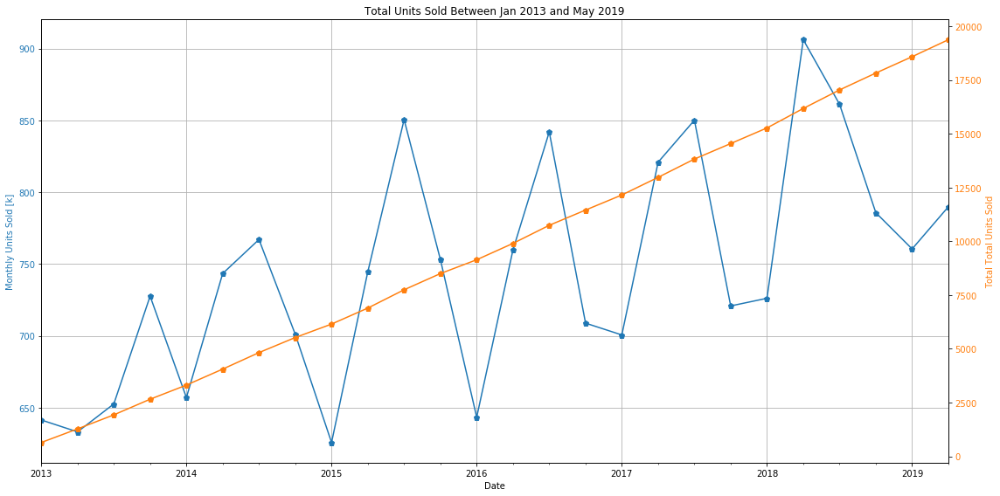

In [54]:
plotSalesData(salesdata, 2013, (16,8))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=238.935, BIC=241.025, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=242.764, BIC=246.942, Fit time=0.156 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=240.922, BIC=244.056, Fit time=0.015 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(1, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=240.768, BIC=243.902, Fit time=0.042 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=234.692, BIC=237.826, Fit time=0.047 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds


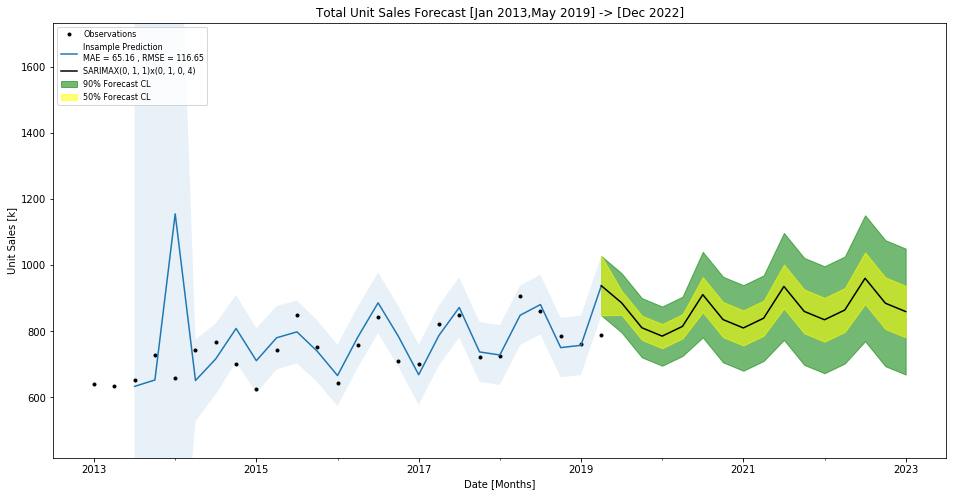

In [61]:
totalfullresults = fitSalesData(salesdata, (16,8), m=4)

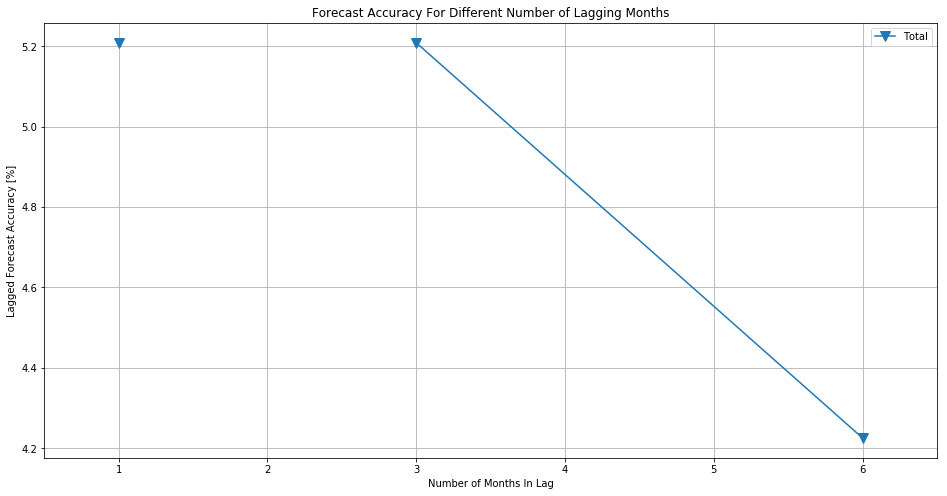

In [62]:
plotResiduals(totalfullresults, size=(16,8))

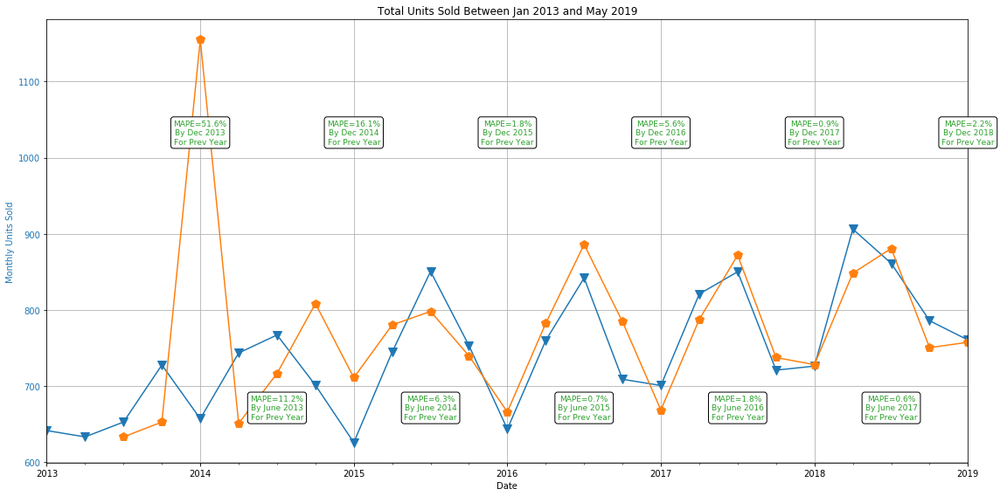

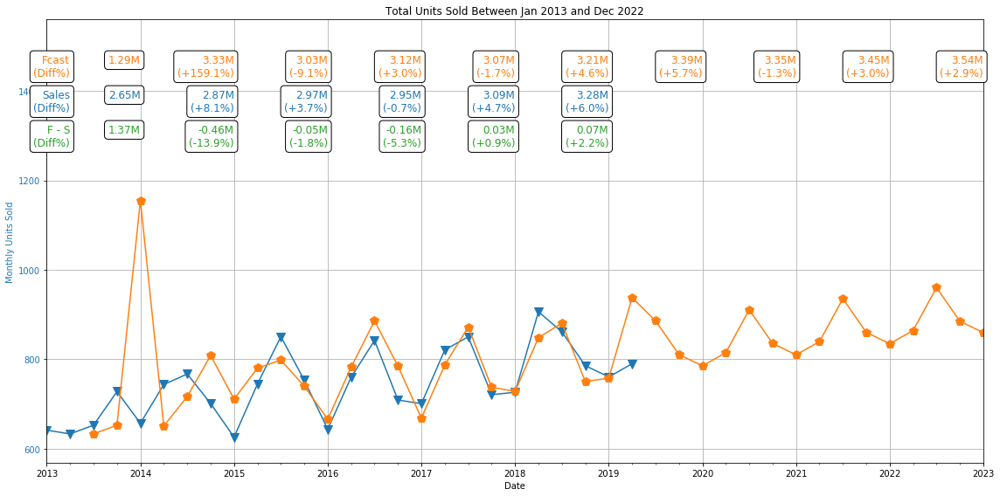

In [63]:
indivMapePlots(totalfullresults, startYear, size=(16,8))
totalfullresultsdf = masterPlot(totalfullresults, startYear, size=(16,8), fontsize=12)
#totalfullresultsdf

In [64]:
totalfullresultsdf

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,1285.793,1369.187,51.571,NaN,NaN,None
2014,2868.731,3330.894,-462.163,-16.110,7.451,61.398,25.5
2015,2974.226,3028.990,-54.764,-1.841,3.547,-9.967,5.59
2016,2954.154,3118.842,-164.688,-5.575,-0.679,2.881,4.86
2017,3092.653,3065.323,27.330,0.884,4.478,-1.746,3.76
2018,3279.449,3207.648,71.801,2.189,5.696,4.437,3.72
2019,1550.477,3391.755,NaN,NaN,NaN,5.428,3.42
2020,0.000,3346.051,NaN,NaN,NaN,-1.366,-1.35
2021,0.000,3445.072,NaN,NaN,NaN,2.874,2.96
2022,0.000,3544.093,NaN,NaN,NaN,2.794,2.87


In [65]:
# Brian Delph's Report 2006-2010
#   Sandy Sershal (consultant, old VP)

In [66]:
3.333/3.279-1

0.016468435498627754

## Profit Center Prediction

In [67]:
data = read_pickle("Aggdata/ProfitCenterSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

## CUSTOMER INVENTORY SALES  (15 WEEKS OF SUPPLY VS 6-14)
## MAJOR ISSUES IN THE LATTER PART OF THE YEAR
## POS DATA IS BETTER THAN SHIPMENT DATA

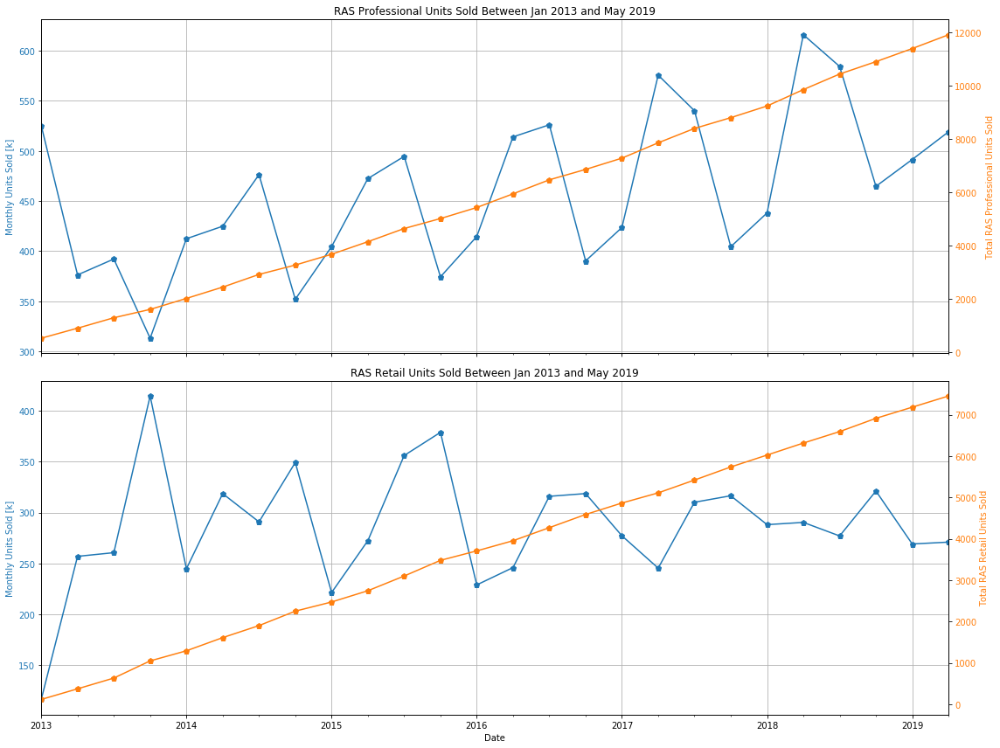

In [68]:
plotSalesData(salesdata, startYear, (16,12))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=232.591, BIC=234.680, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=235.141, BIC=239.319, Fit time=0.081 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=230.203, BIC=234.381, Fit time=0.095 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=233.474, BIC=238.697, Fit time=0.101 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=229.464, BIC=232.598, Fit time=0.052 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=230.120, BIC=234.298, Fit time=0.10

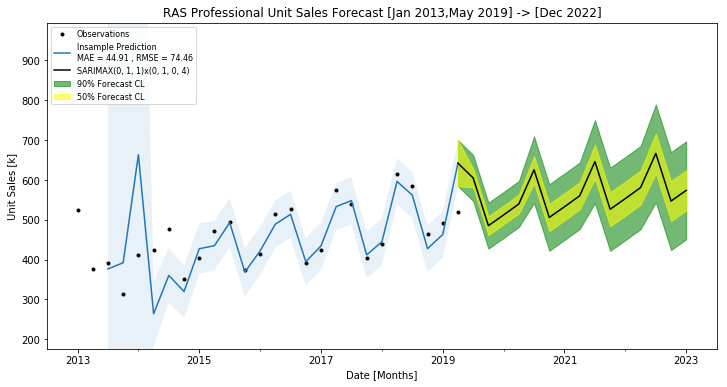

(12, 6)


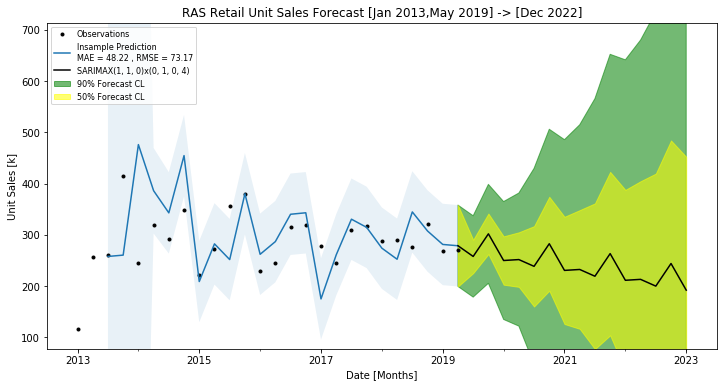

In [69]:
pcfullresults = fitSalesData(salesdata, (12,6))

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,1286.441,1368.539,51.546,NaN,NaN,None
2014,2868.731,3266.336,-397.605,-13.860,7.451,60.615,23
2015,2974.226,2846.269,127.957,4.302,3.547,-14.759,-0.783
2016,2954.154,3050.518,-96.364,-3.262,-0.679,6.696,2.57
2017,3092.653,3007.804,84.849,2.744,4.478,-1.420,1.82
2018,3279.449,3208.164,71.285,2.174,5.696,6.245,3.74
2019,1550.477,3314.347,NaN,NaN,NaN,3.204,1.06
2020,0.000,3205.252,NaN,NaN,NaN,-3.404,-3.29
2021,0.000,3210.393,NaN,NaN,NaN,0.160,0.16
2022,0.000,3215.534,NaN,NaN,NaN,0.160,0.16


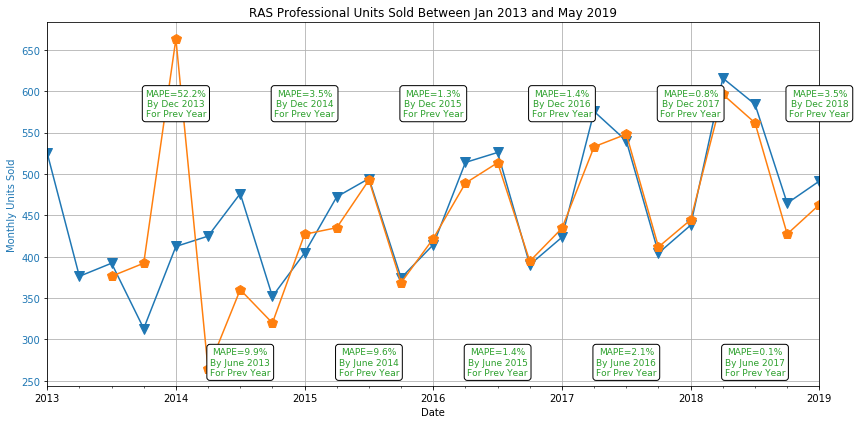

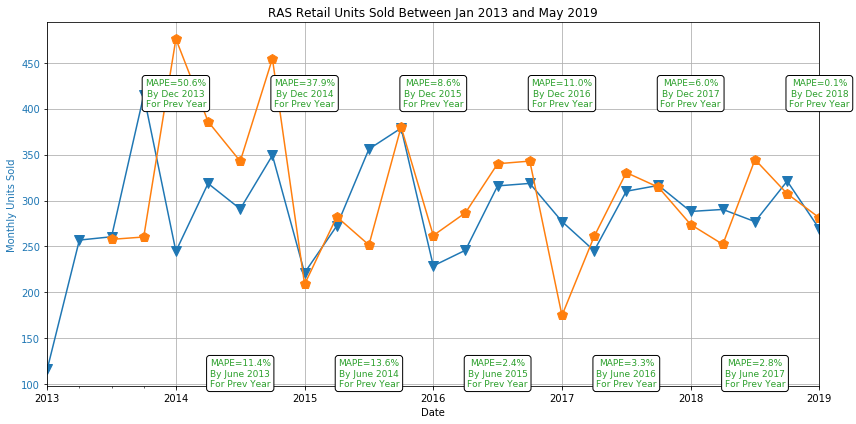

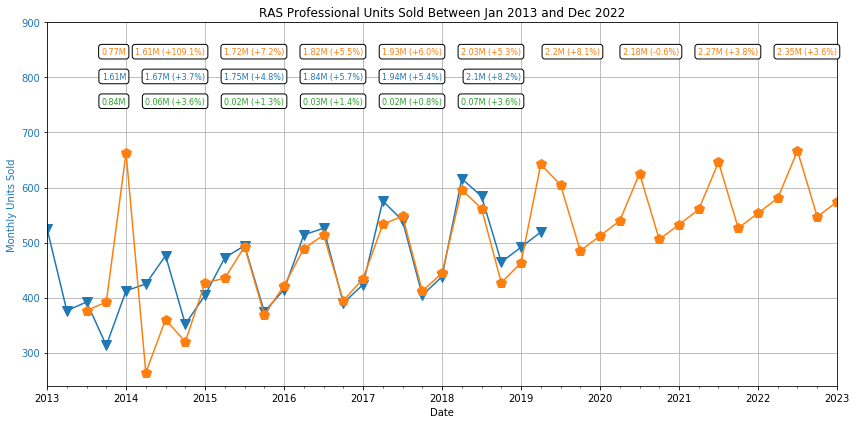

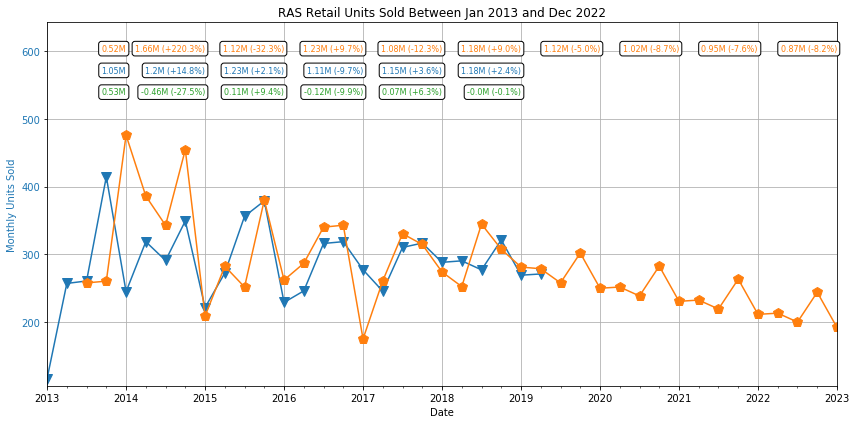

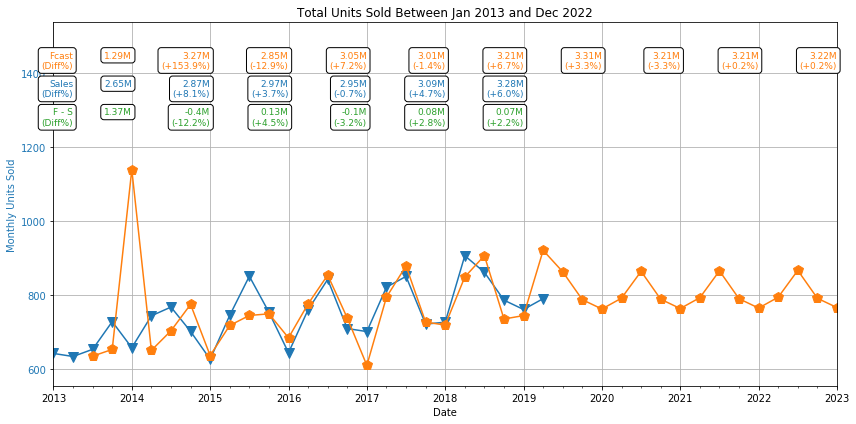

In [70]:
indivMapePlots(pcfullresults, startYear, (12,6))
indivMasterPlots(pcfullresults, startYear, (12,6))
pcfullresultsdf = masterPlot(pcfullresults, startYear, (12,6))
pcfullresultsdf

## Category Prediction

In [71]:
data = read_pickle("Aggdata/CategorySales.p")
startYear = 2013
salesdata = cutData(data, startYear)

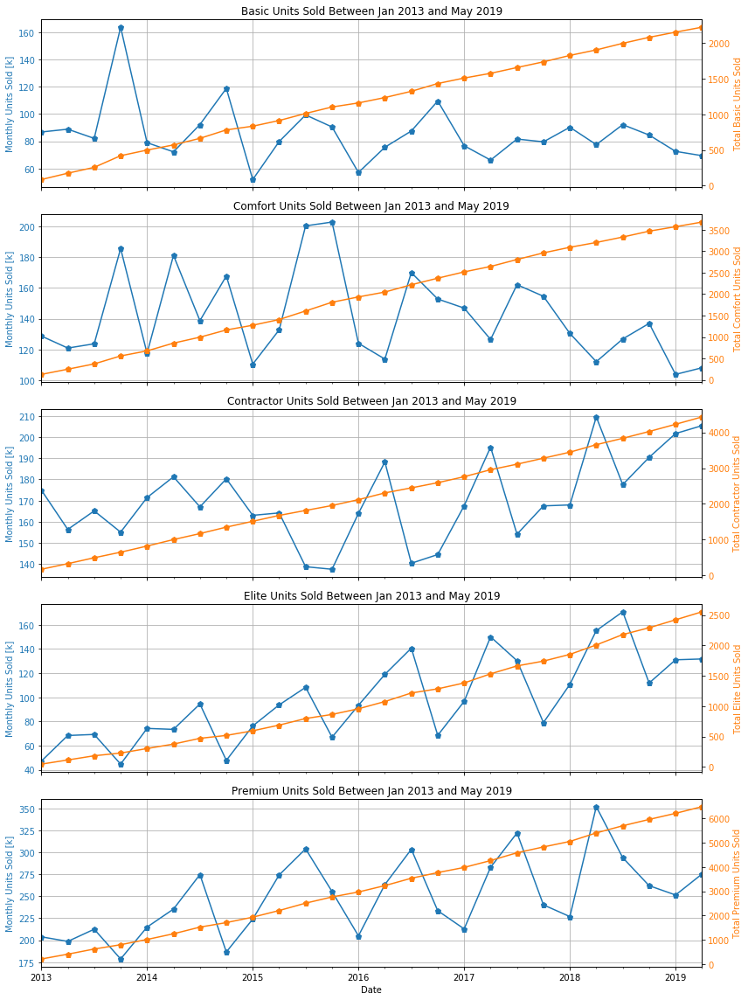

In [72]:
plotSalesData(salesdata, startYear, size=(12,16))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=191.399, BIC=196.621, Fit time=0.166 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=198.233, BIC=200.323, Fit time=0.007 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=198.578, BIC=202.757, Fit time=0.068 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=189.434, BIC=193.612, Fit time=0.076 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=191.174, BIC=196.396, Fit time=0.147 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=187.565, BIC=190.699, Fit time=0.065 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=189.553, BIC=193.731, Fit time=0.086 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=189.486, BIC=19

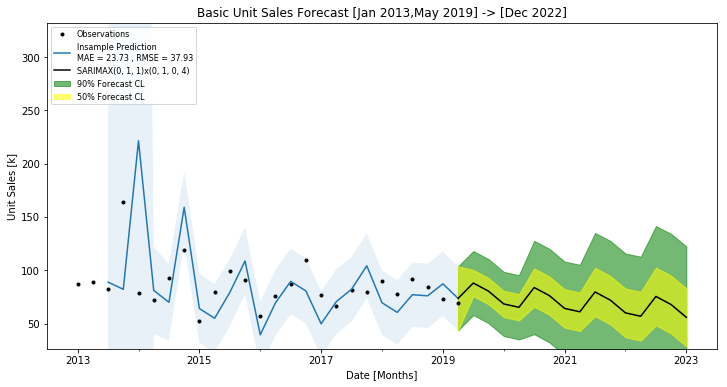

(12, 6)


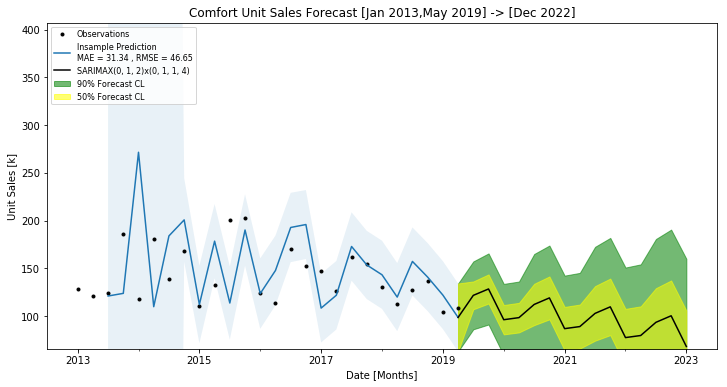

(12, 6)


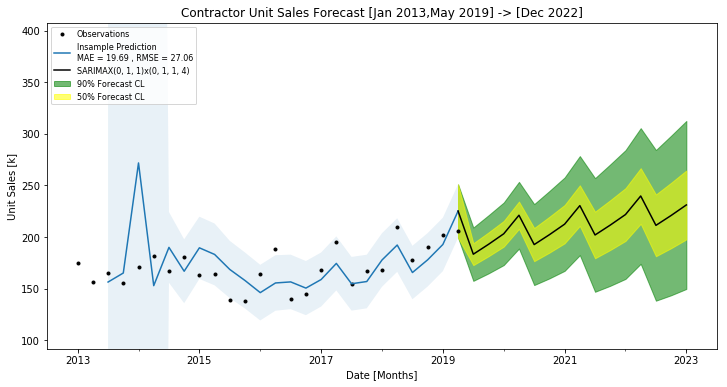

(12, 6)


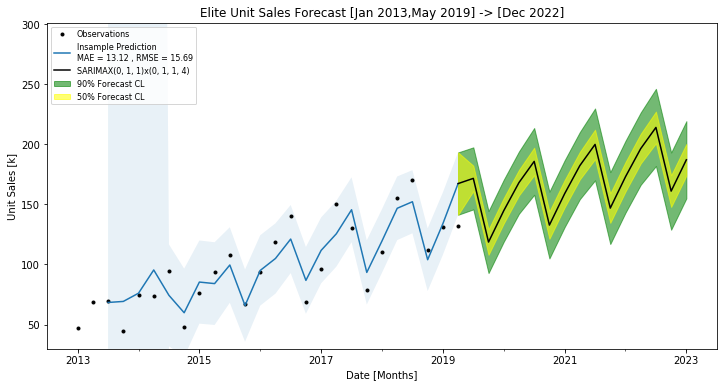

(12, 6)


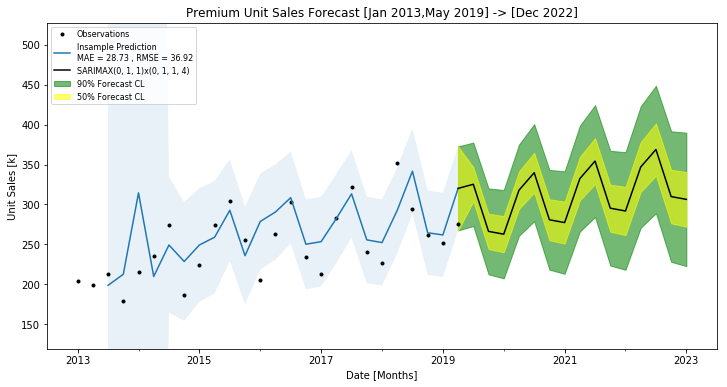

In [73]:
catfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,1285.834,1369.146,51.569,NaN,NaN,None
2014,2868.731,3386.246,-517.515,-18.040,7.451,62.028,27.5
2015,2974.226,2971.402,2.824,0.095,3.547,-13.961,3.58
2016,2954.154,3083.159,-129.005,-4.367,-0.679,3.625,3.66
2017,3092.653,3088.806,3.847,0.124,4.478,0.183,4.56
2018,3279.449,3231.084,48.365,1.475,5.696,4.403,4.48
2019,1550.477,3359.028,NaN,NaN,NaN,3.809,2.43
2020,0.000,3371.156,NaN,NaN,NaN,0.360,0.361
2021,0.000,3468.943,NaN,NaN,NaN,2.819,2.9
2022,0.000,3566.731,NaN,NaN,NaN,2.742,2.82


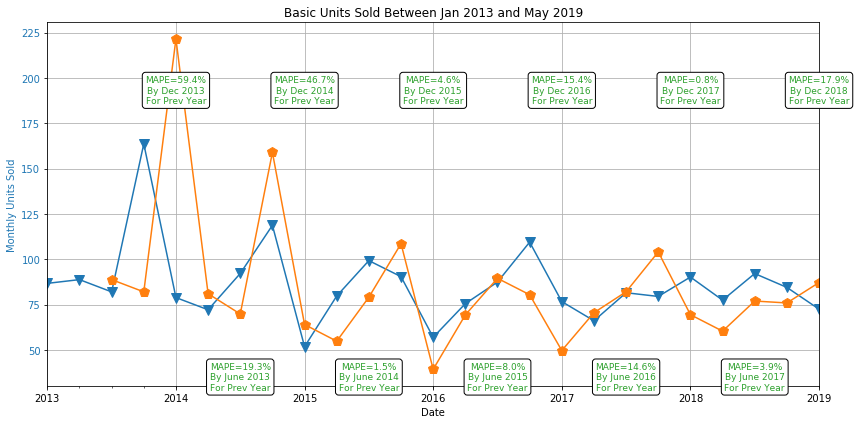

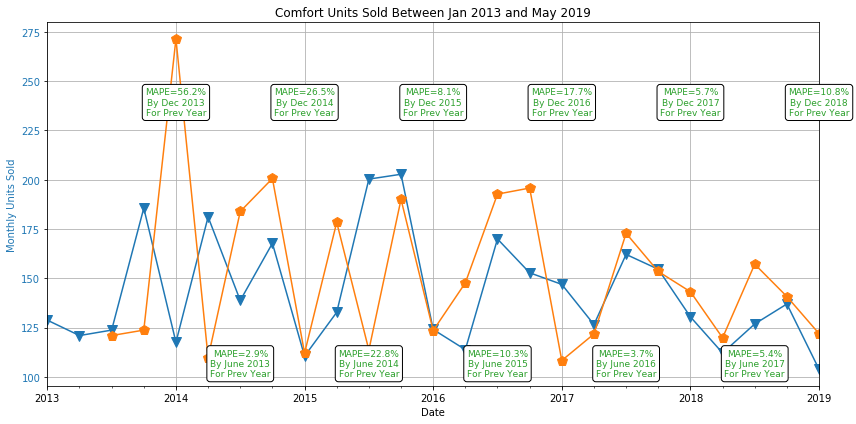

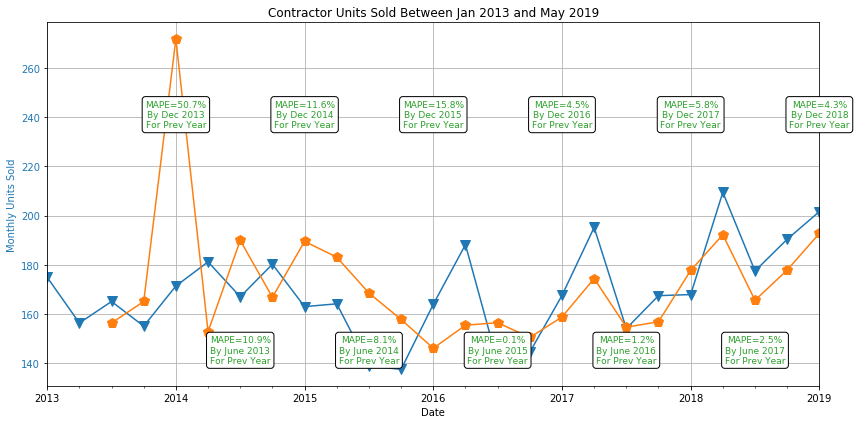

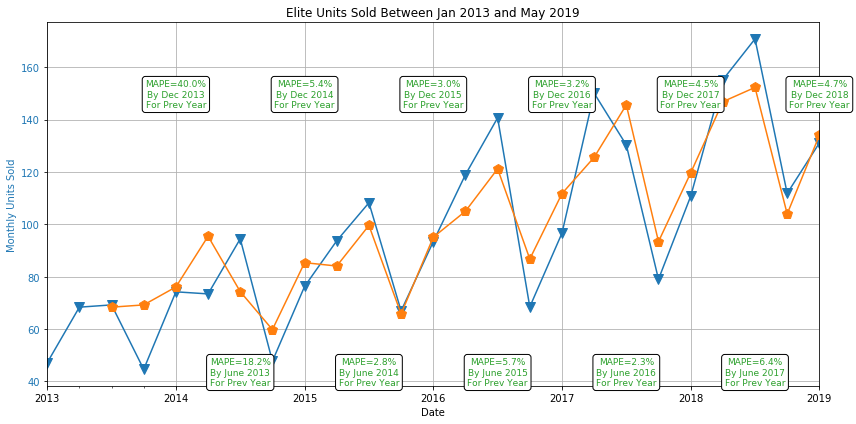

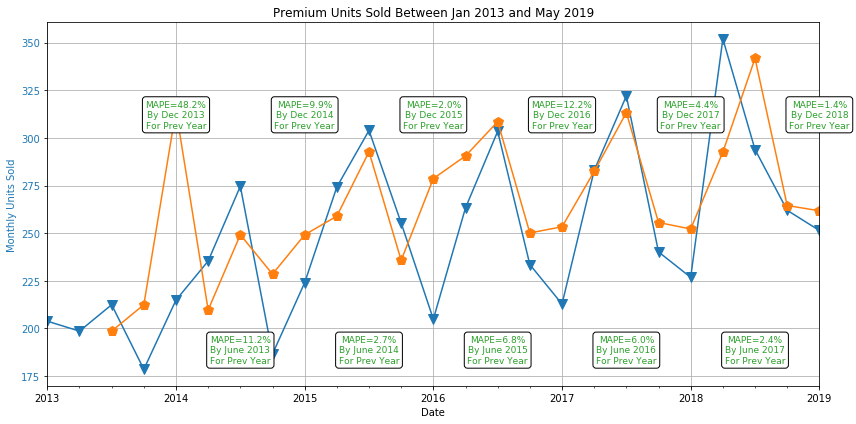

...

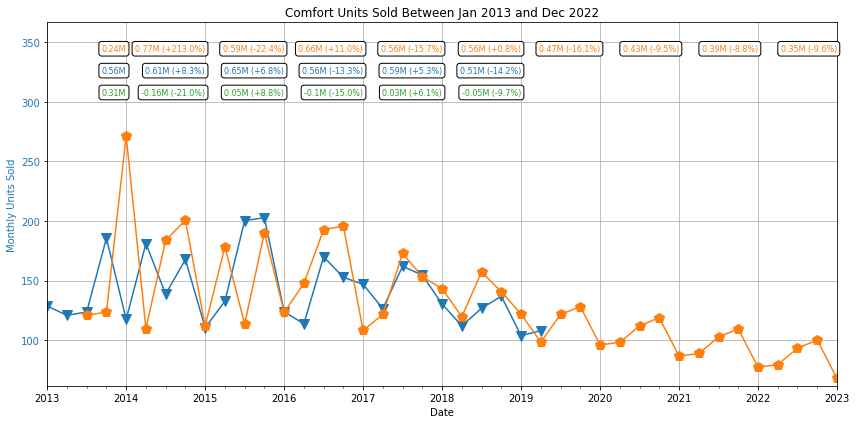

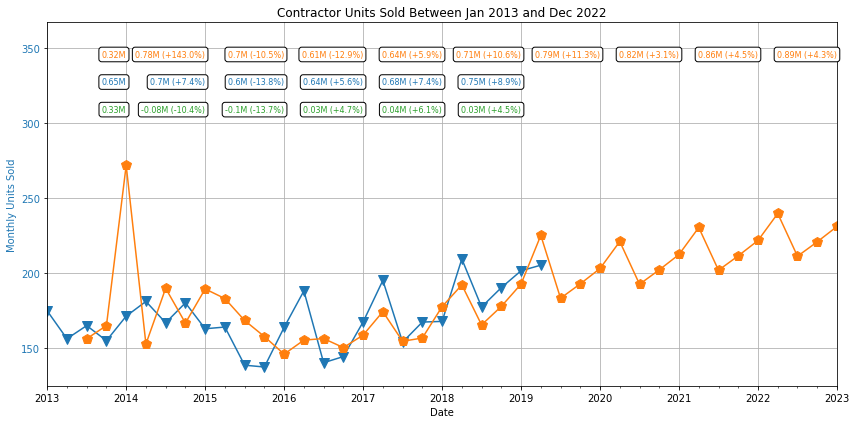

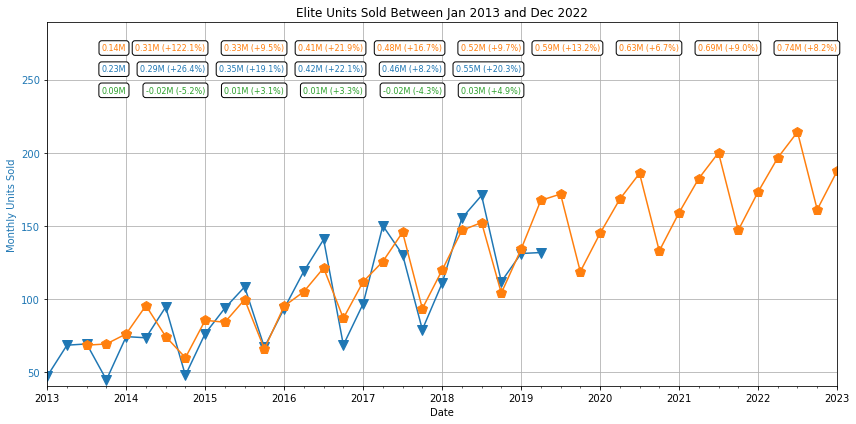

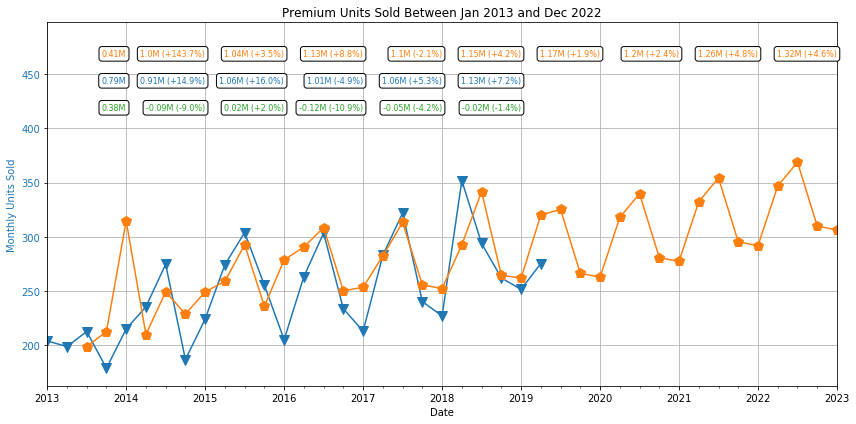

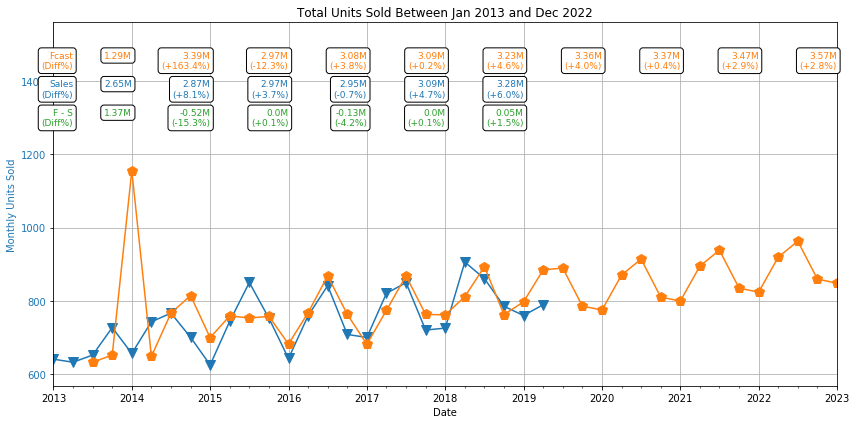

In [74]:
indivMapePlots(catfullresults, startYear)
indivMasterPlots(catfullresults, startYear)
catfullresultsdf = masterPlot(catfullresults, startYear)
catfullresultsdf

# Regional Sales

In [75]:
data = read_pickle("Aggdata/RegionalSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

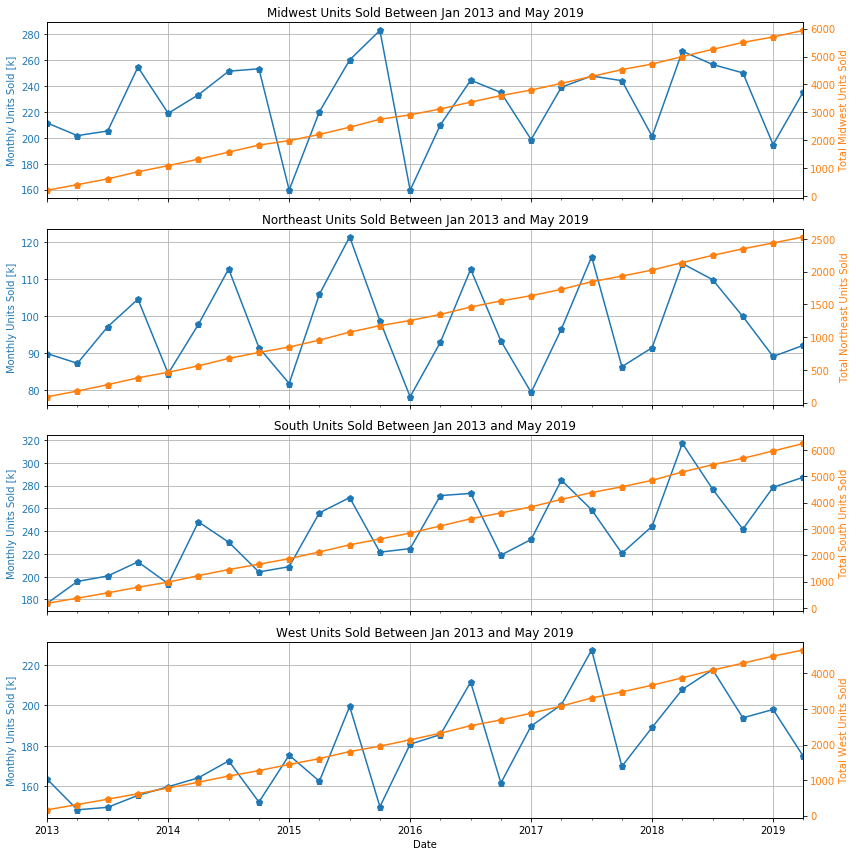

In [76]:
plotSalesData(salesdata, startYear, size=(12,12))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=209.252, BIC=211.342, Fit time=0.008 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=212.678, BIC=216.856, Fit time=0.075 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=206.104, BIC=210.282, Fit time=0.093 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=207.072, BIC=212.294, Fit time=0.159 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=205.973, BIC=209.107, Fit time=0.046 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=207.612, BIC=211.790, Fit time=0.09

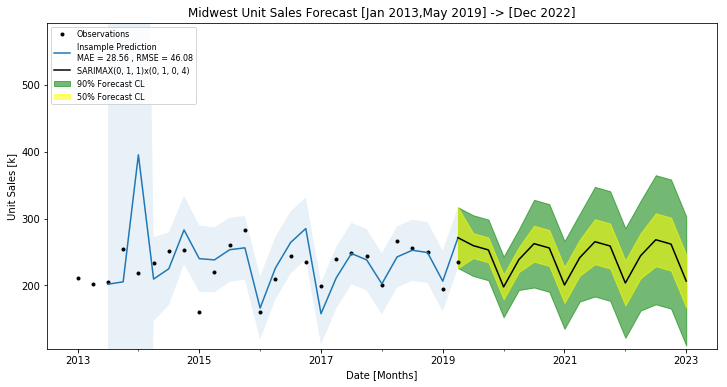

(12, 6)


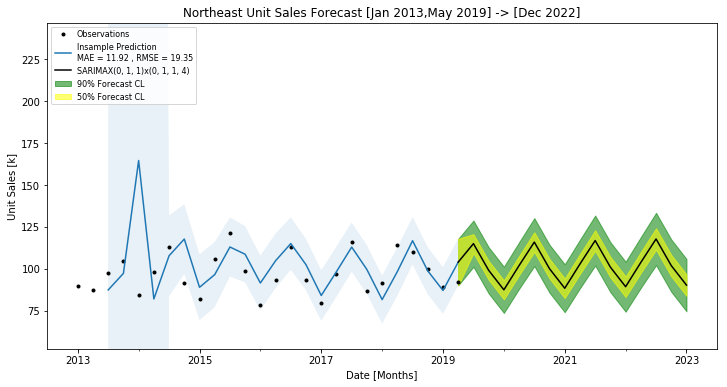

(12, 6)


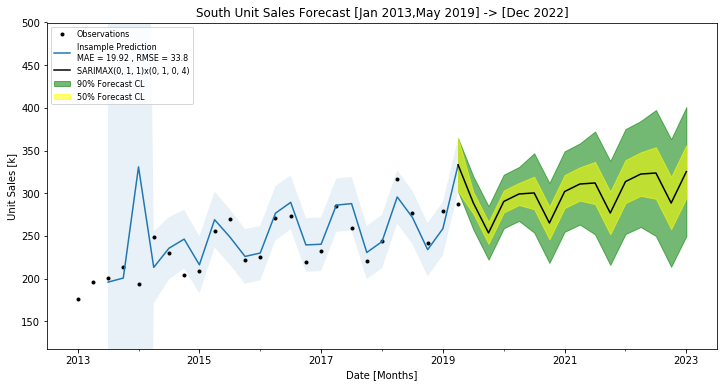

(12, 6)


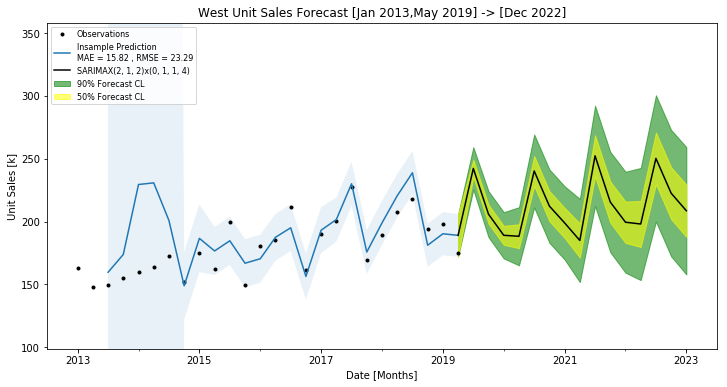

In [77]:
regfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,1321.663,1333.317,50.219,NaN,NaN,None
2014,2868.731,3420.622,-551.891,-19.238,7.451,61.362,28.8
2015,2974.226,3069.610,-95.384,-3.207,3.547,-11.435,7
2016,2954.154,3099.270,-145.116,-4.912,-0.679,0.957,4.2
2017,3092.653,3094.747,-2.094,-0.068,4.478,-0.146,4.76
2018,3279.449,3225.890,53.559,1.633,5.696,4.065,4.31
2019,1550.477,3356.583,NaN,NaN,NaN,3.894,2.35
2020,0.000,3344.718,NaN,NaN,NaN,-0.355,-0.353
2021,0.000,3428.626,NaN,NaN,NaN,2.447,2.51
2022,0.000,3509.304,NaN,NaN,NaN,2.299,2.35


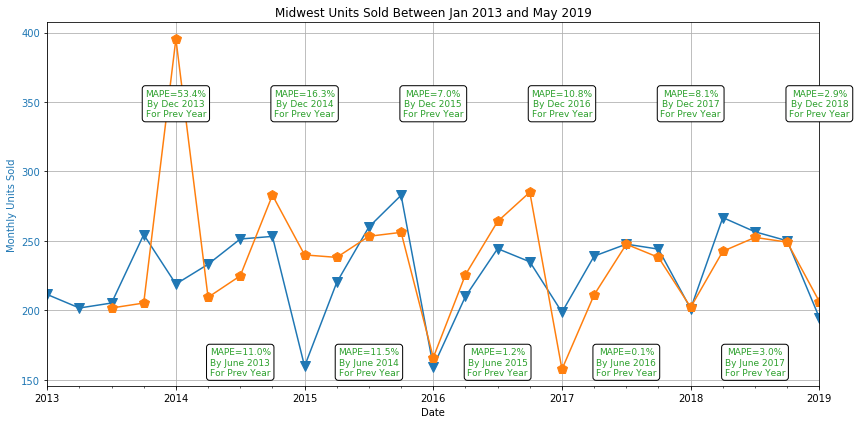

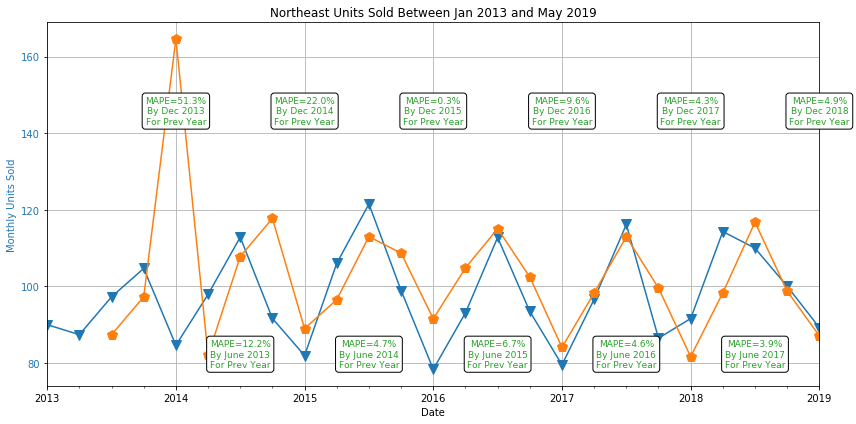

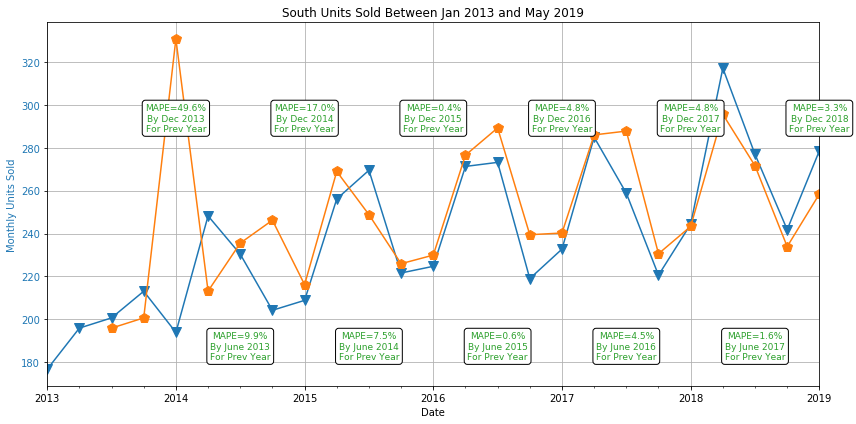

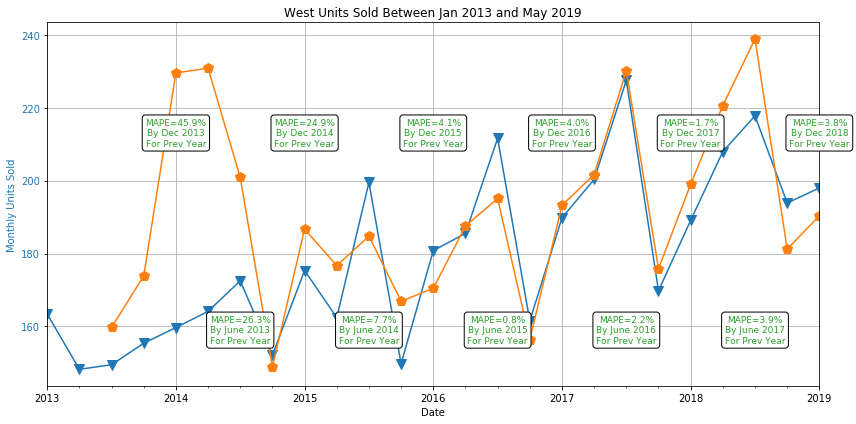

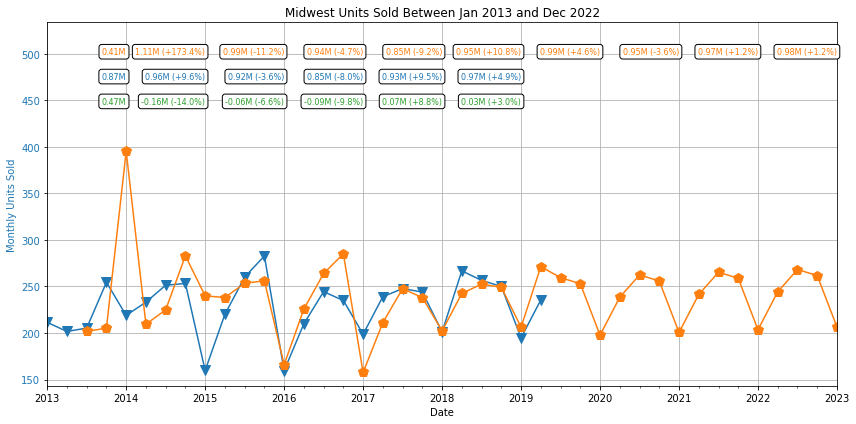

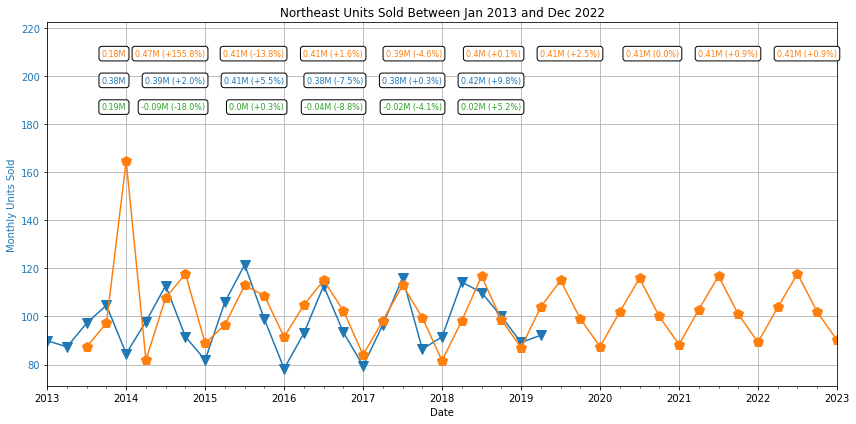

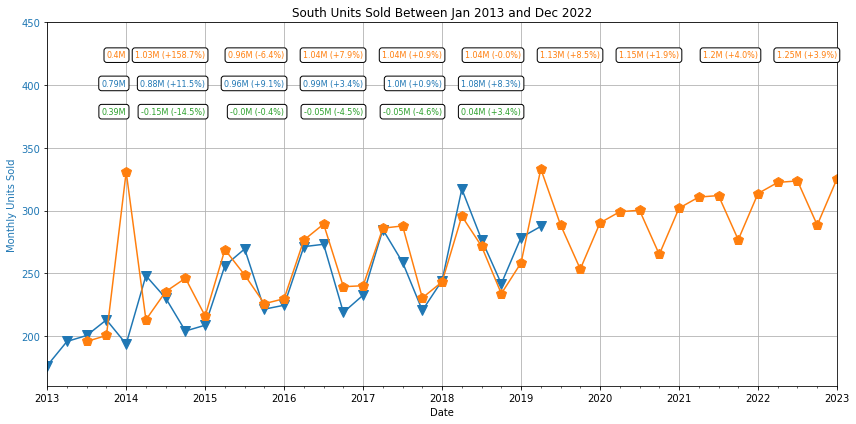

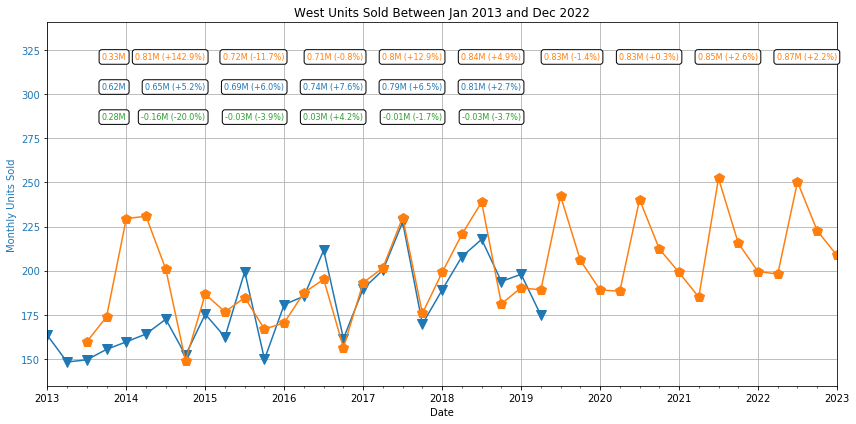

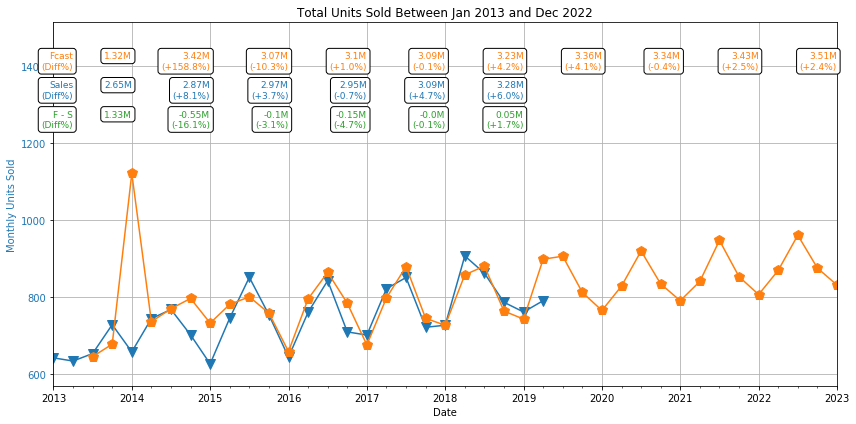

In [78]:
indivMapePlots(regfullresults, startYear)
indivMasterPlots(regfullresults, startYear)
regfullresultsdf = masterPlot(regfullresults, startYear)
regfullresultsdf

# Profit Center / Category Sales

In [79]:
data = read_pickle("Aggdata/ProfitCenterCategorySales.p")
startYear = 2013
salesdata = cutData(data, startYear)

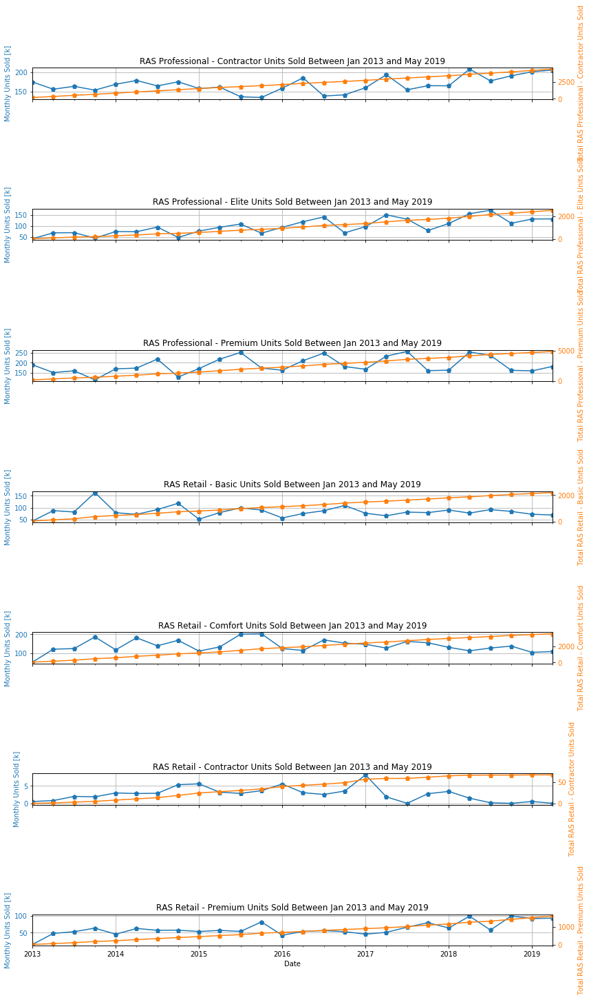

In [80]:
plotSalesData(salesdata, startYear, size=(12,20))

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=187.104, BIC=192.326, Fit time=0.163 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=189.209, BIC=191.298, Fit time=0.005 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=189.559, BIC=193.737, Fit time=0.052 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=186.224, BIC=190.402, Fit time=0.096 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=187.800, BIC=193.023, Fit time=0.180 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=187.921, BIC=191.055, Fit time=0.065 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 4); AIC=189.092, BIC=192.225, Fit time=0.027 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 4); AIC=187.187, BIC=19

Fit ARIMA: order=(2, 1, 1) seasonal_order=(2, 1, 0, 4); AIC=186.123, BIC=193.434, Fit time=0.252 seconds
Fit ARIMA: order=(2, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(2, 1, 1) seasonal_order=(2, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=187.416, BIC=192.639, Fit time=0.075 seconds
Fit ARIMA: order=(3, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=186.817, BIC=194.129, Fit time=0.128 seconds
Fit ARIMA: order=(2, 1, 2) seasonal_order=(1, 1, 0, 4); AIC=186.332, BIC=193.644, Fit time=0.224 seconds
Total fit time: 1.347 seconds
(12, 6)


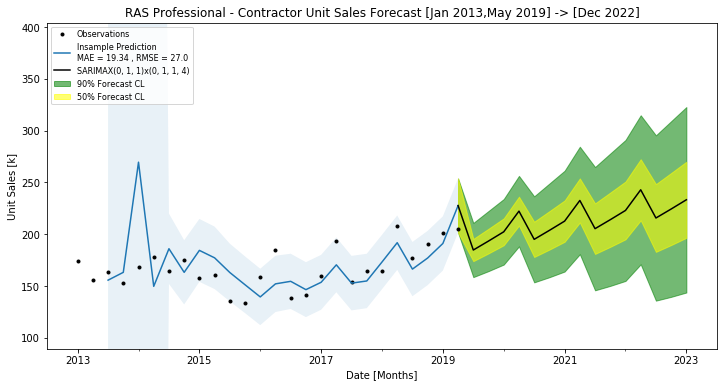

(12, 6)


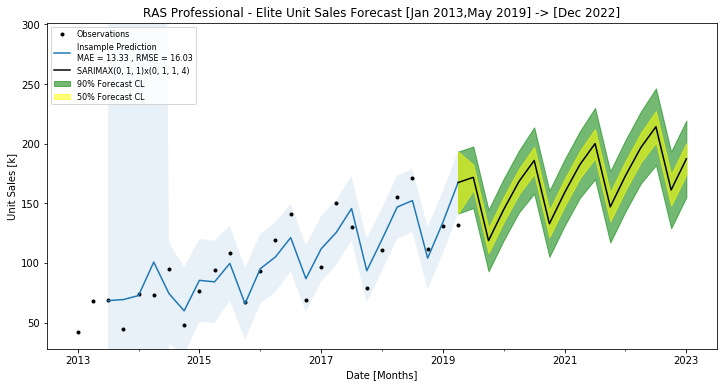

(12, 6)


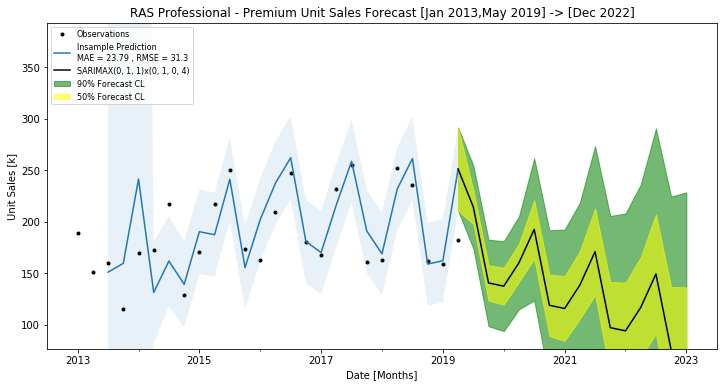

(12, 6)


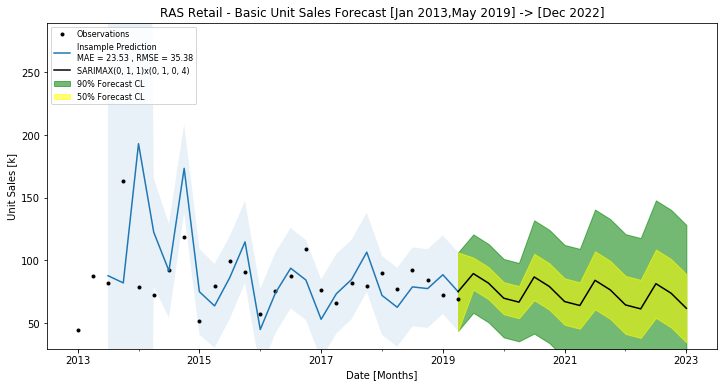

(12, 6)


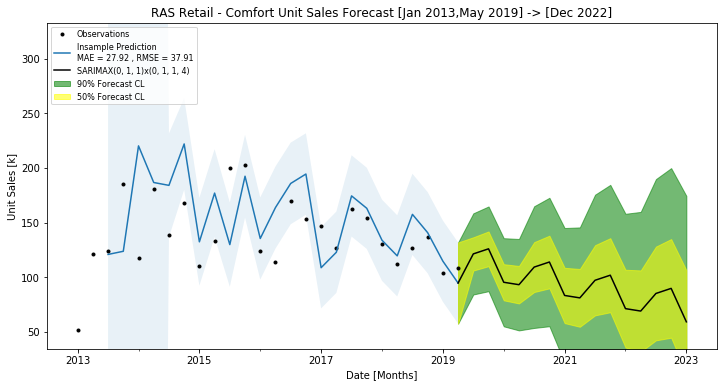

(12, 6)


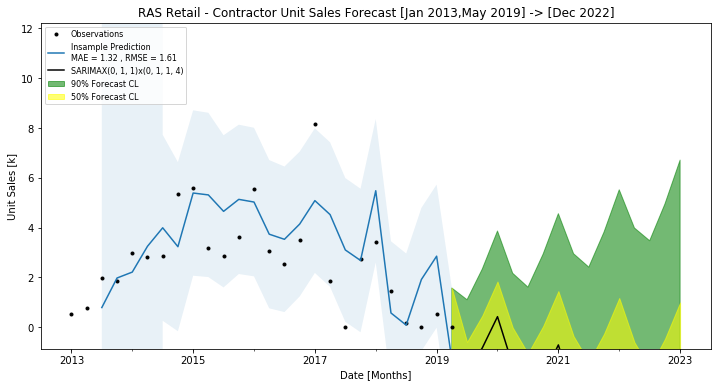

(12, 6)


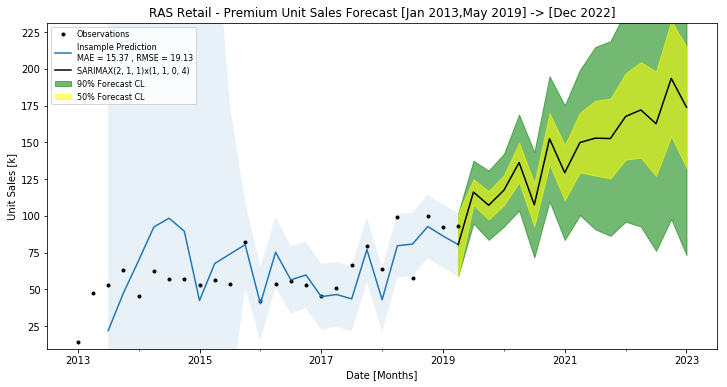

In [81]:
pccatfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2529.107,1254.052,1275.055,50.415,NaN,NaN,None
2014,2868.731,3506.249,-637.518,-22.223,11.839,64.234,38.6
2015,2974.226,3041.914,-67.688,-2.276,3.547,-15.265,6.04
2016,2954.154,3108.320,-154.166,-5.219,-0.679,2.136,4.51
2017,3092.653,3058.896,33.757,1.092,4.478,-1.616,3.55
2018,3279.449,3199.274,80.175,2.445,5.696,4.388,3.45
2019,1550.477,3338.138,NaN,NaN,NaN,4.160,1.79
2020,0.000,3286.640,NaN,NaN,NaN,-1.567,-1.54
2021,0.000,3305.208,NaN,NaN,NaN,0.562,0.565
2022,0.000,3363.851,NaN,NaN,NaN,1.743,1.77


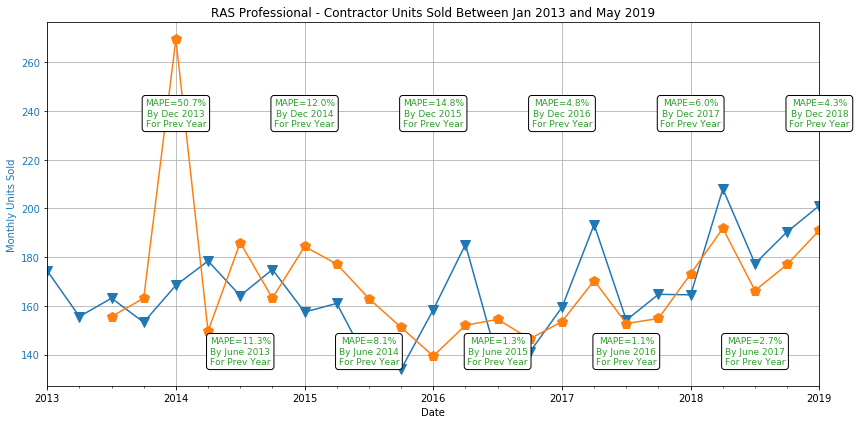

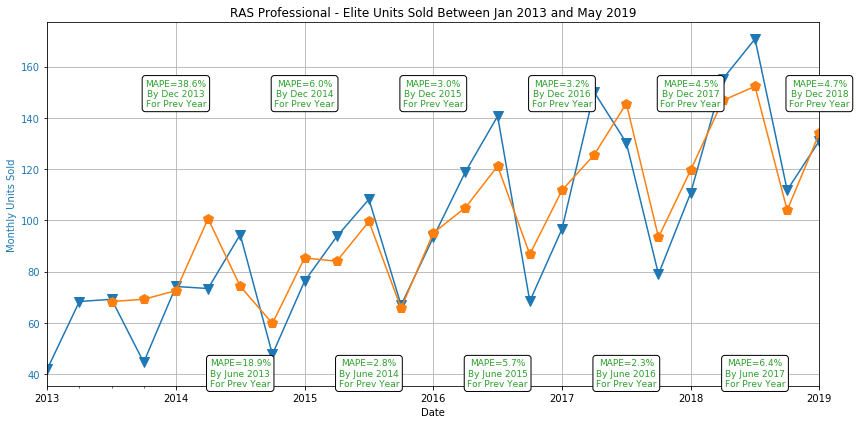

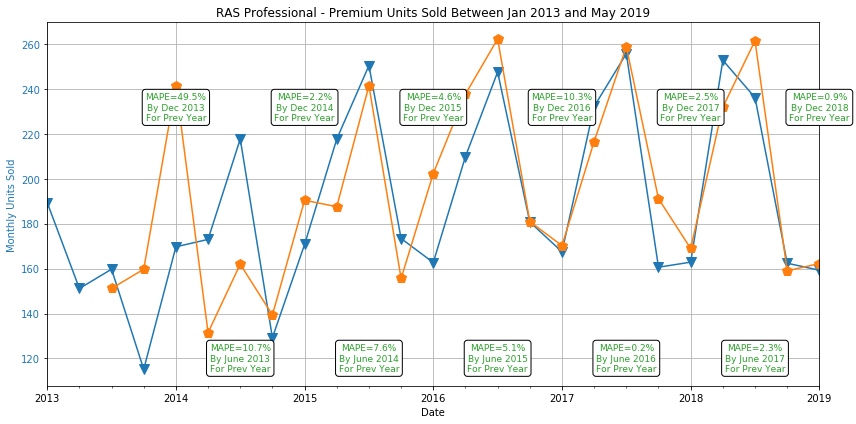

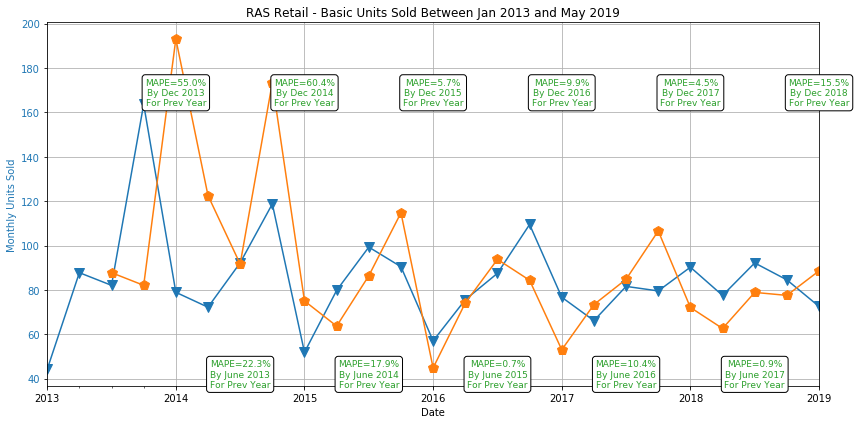

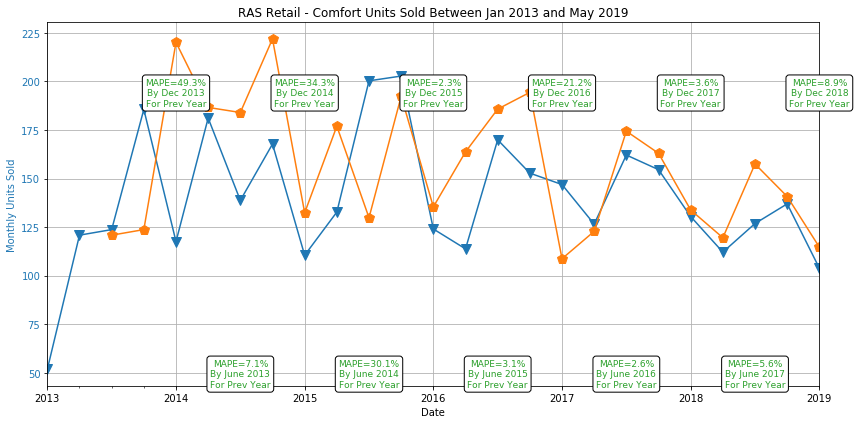

...

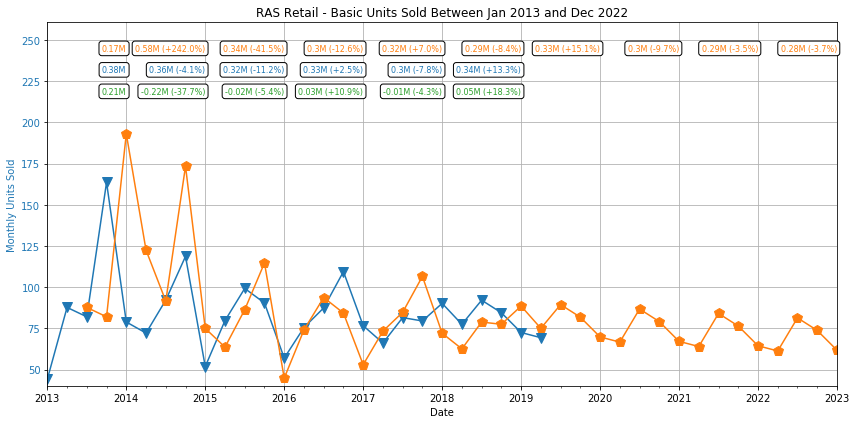

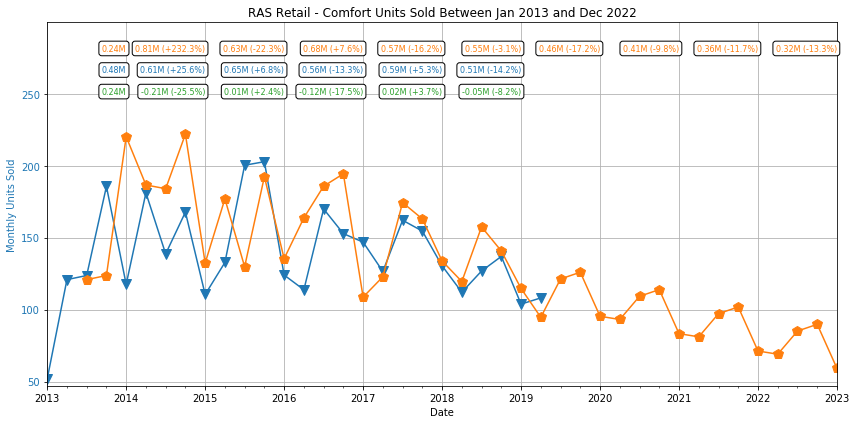

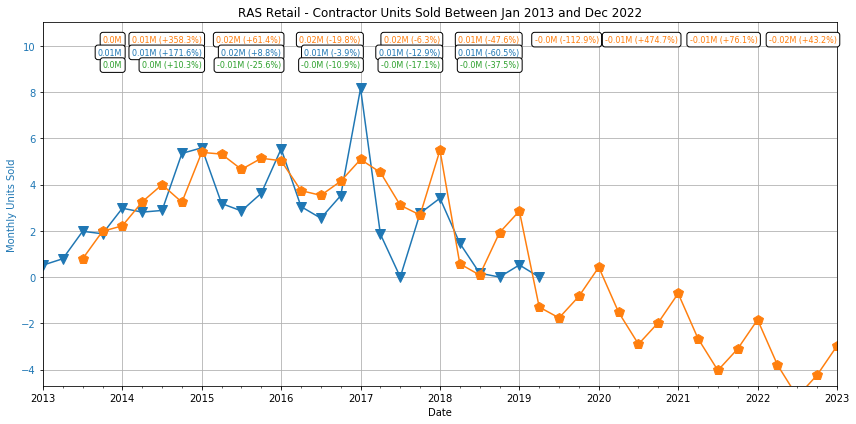

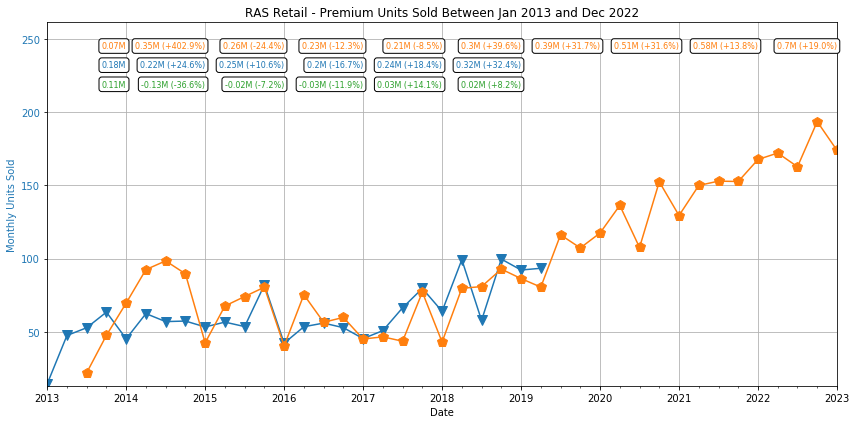

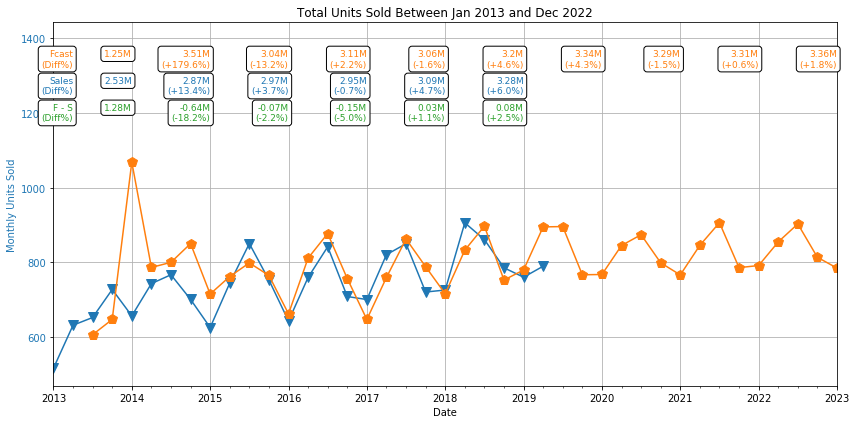

In [82]:
indivMapePlots(pccatfullresults, startYear)
indivMasterPlots(pccatfullresults, startYear)
pccatfullresultsdf = masterPlot(pccatfullresults, startYear)
pccatfullresultsdf

# Profit Center / Category / Region Sales

In [83]:
data = read_pickle("Aggdata/ProfitCenterCategoryRegionSales.p")
startYear = 2013
salesdata = cutData(data, startYear)

/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied. '
/anaconda3/envs/py37/lib/python3.7/site-packages/matplotlib/tight_layout.py:211: UserWarning: Tight layout not applied. tight_layout cannot make axes height small enough to accommodate all axes decorations
  warnings.warn('Tight layout not applied

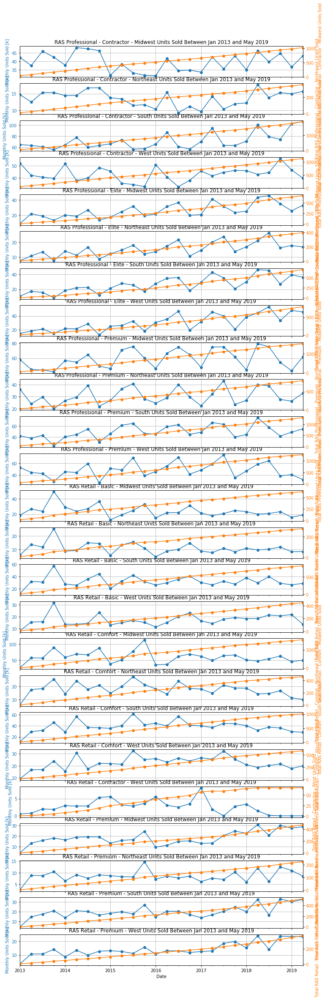

In [84]:
plotSalesData(salesdata, startYear, size=(12,40))

In [131]:
tmp[tmp < 0] = 0
tmp

,data,central,lower value,upper value
2013-03-31,42.374,NaN,NaN,NaN
2013-06-30,37.470,NaN,NaN,NaN
2013-09-30,45.959,37.470,0.000,2363.656
2013-12-31,42.480,45.959,0.000,2372.145
2014-03-31,37.713,70.729,0.000,2194.239
2014-06-30,48.125,32.809,0.000,1677.684
2014-09-30,47.476,56.614,48.178,65.050
2014-12-31,46.369,47.539,39.762,55.316
2015-03-31,31.677,42.136,34.482,49.790
2015-06-30,38.342,45.116,37.509,52.724


In [130]:
tmp = pccatregfullresults['RAS Professional - Contractor - Midwest'].copy()

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=140.707, BIC=142.796, Fit time=0.007 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=140.668, BIC=144.846, Fit time=0.044 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=139.729, BIC=143.907, Fit time=0.045 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=141.728, BIC=146.951, Fit time=0.097 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=141.786, BIC=144.920, Fit time=0.026 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 4); AIC=140.676, BIC=143.809, Fit time=0.027 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 4); AIC=140.997, BIC=146.219, Fit

Fit ARIMA: order=(2, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=137.080, BIC=141.258, Fit time=0.028 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=131.569, BIC=135.747, Fit time=0.113 seconds
Fit ARIMA: order=(2, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=135.297, BIC=141.564, Fit time=0.162 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=132.458, BIC=137.681, Fit time=0.135 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=133.261, BIC=139.528, Fit time=0.223 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=130.053, BIC=133.186, Fit time=0.074 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=131.396, BIC=135.574, Fit time=0.092 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=134.013, BIC=139.235, Fit time=0.101 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=130.668, BIC=134.846, Fit time=0.119 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4);

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=152.526, BIC=156.704, Fit time=0.117 seconds
Fit ARIMA: order=(2, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=159.706, BIC=165.973, Fit time=0.088 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=151.971, BIC=157.194, Fit time=0.162 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(2, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=150.116, BIC=154.294, Fit time=0.113 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(1, 1, 0, 4); AIC=151.900, BIC=157.122, Fit time=0.188 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(1, 1, 0, 4); AIC=154.025, BIC=160.293, Fit time=0.145 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=150.576, BIC=153.709, Fit time=0.091 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(2, 1, 0, 4); AIC=151.292, BIC=15

Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=129.372, BIC=134.595, Fit time=0.181 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=126.163, BIC=129.297, Fit time=0.071 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=130.469, BIC=134.647, Fit time=0.035 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=128.158, BIC=132.336, Fit time=0.151 seconds
Fit ARIMA: order=(1, 1, 2) seasonal_order=(0, 1, 0, 4); AIC=129.531, BIC=134.754, Fit time=0.098 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 0, 4); AIC=127.675, BIC=131.853, Fit time=0.128 seconds
Total fit time: 0.941 seconds
Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=165.288, BIC=170.510, Fit time=0.054 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=175.147, BIC=177.236, Fit time=0.005 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=165.326, BIC=169.504, Fit time=0.048 seconds
Fit ARIMA: order=(0, 1, 1

Fit ARIMA: order=(1, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=121.688, BIC=126.911, Fit time=0.115 seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 0, 4); AIC=138.054, BIC=140.143, Fit time=0.006 seconds
Fit ARIMA: order=(1, 1, 0) seasonal_order=(1, 1, 0, 4); AIC=126.457, BIC=130.635, Fit time=0.042 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 1, 4); AIC=120.614, BIC=124.792, Fit time=0.136 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 1, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 0, 4); AIC=125.210, BIC=128.344, Fit time=0.084 seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(0, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 1) seasonal_order=(1, 1, 2, 4); AIC=nan, BIC=nan, Fit time=nan seconds
Fit ARIMA: order=(0, 1, 0) seasonal_order=(0, 1, 1, 4); AIC=129.779, BIC=132.913, Fit time=0.062 seconds
Fit ARIMA: order=(0, 1, 2) seasonal_order=(0, 1, 1, 4); AIC=121.415, BIC=126.638, Fit

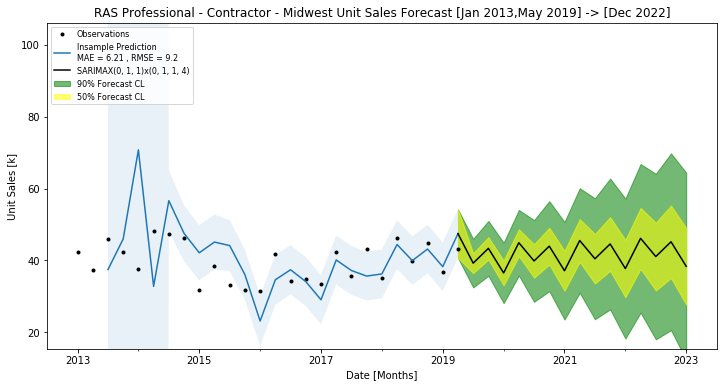

(12, 6)


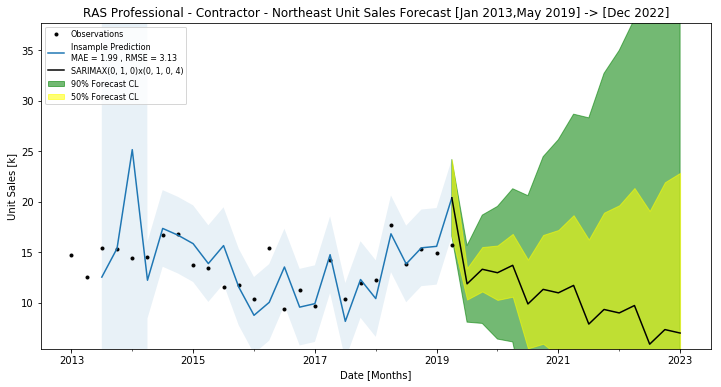

(12, 6)


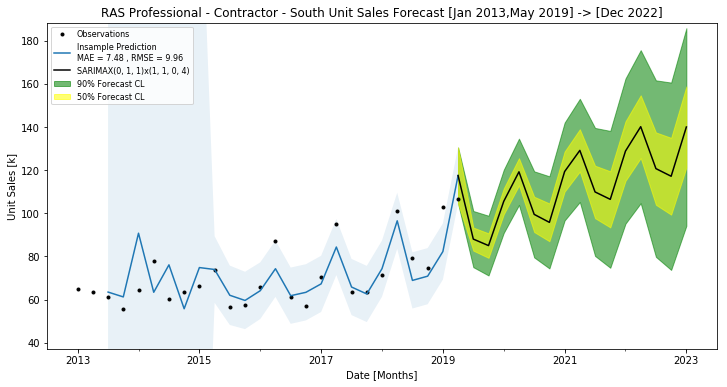

(12, 6)


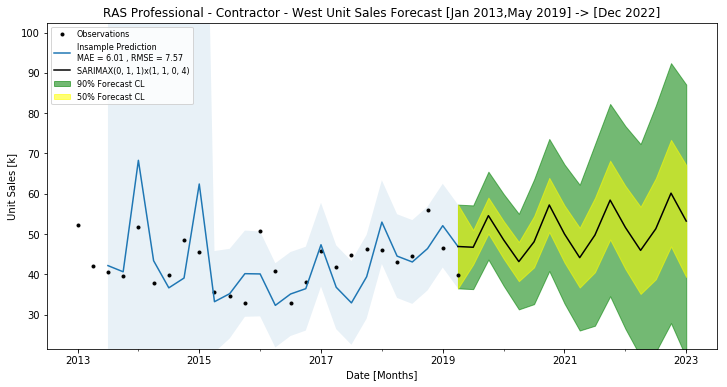

(12, 6)


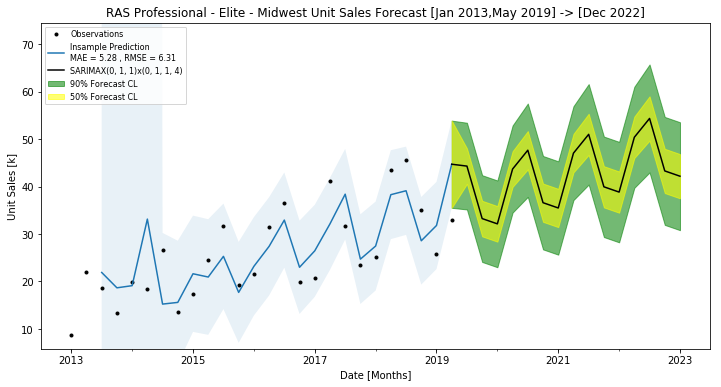

(12, 6)


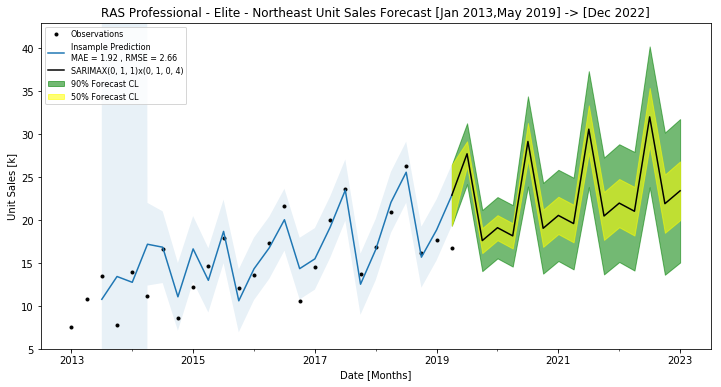

(12, 6)


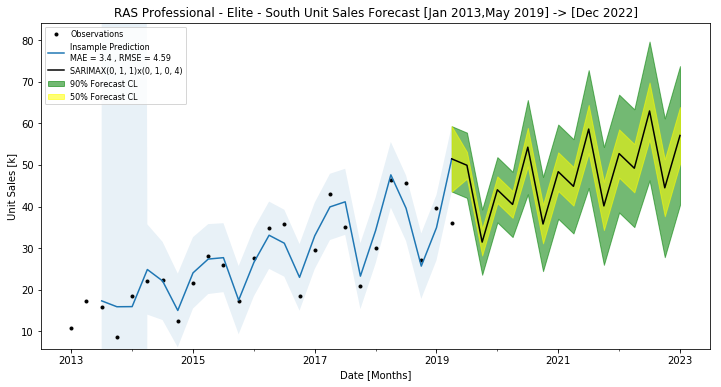

(12, 6)


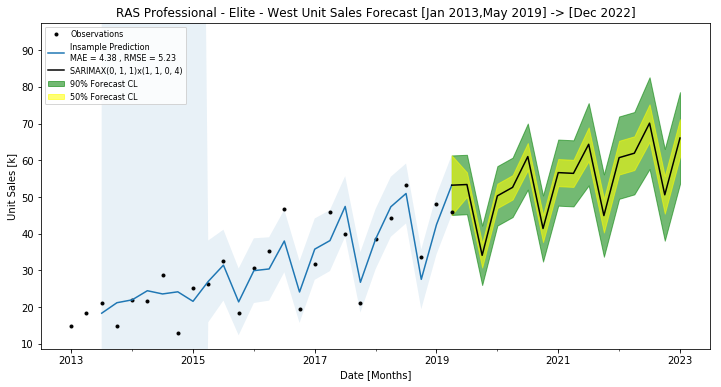

(12, 6)


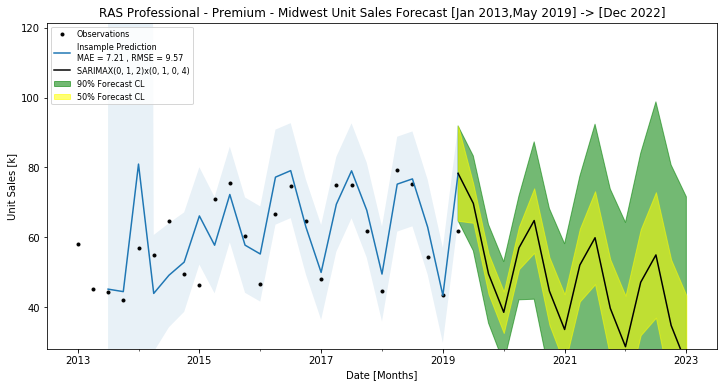

(12, 6)


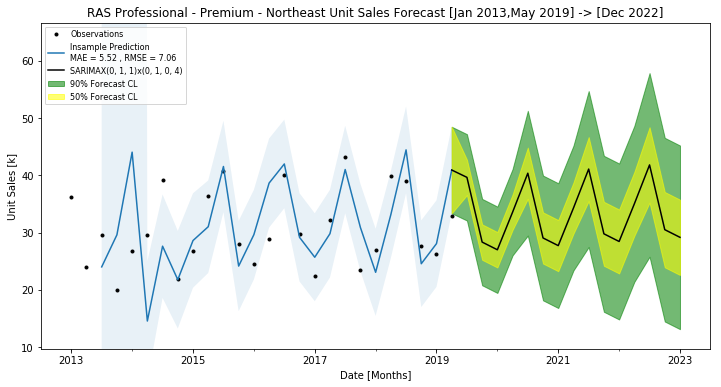

(12, 6)


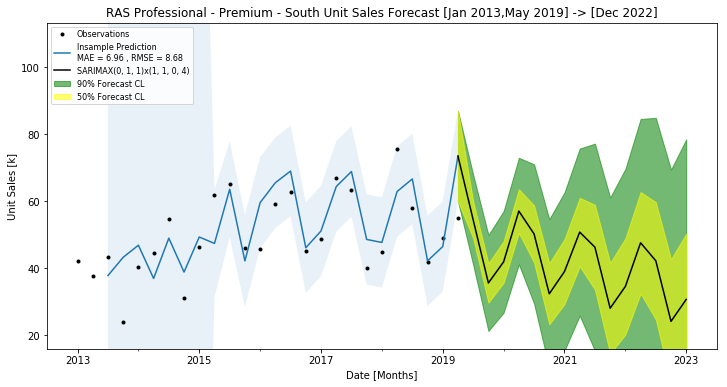

(12, 6)


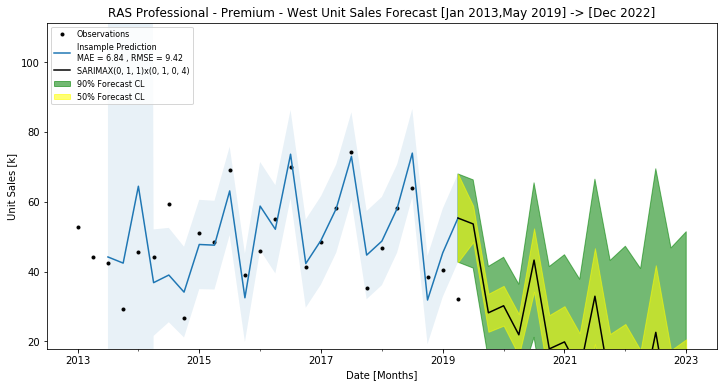

(12, 6)


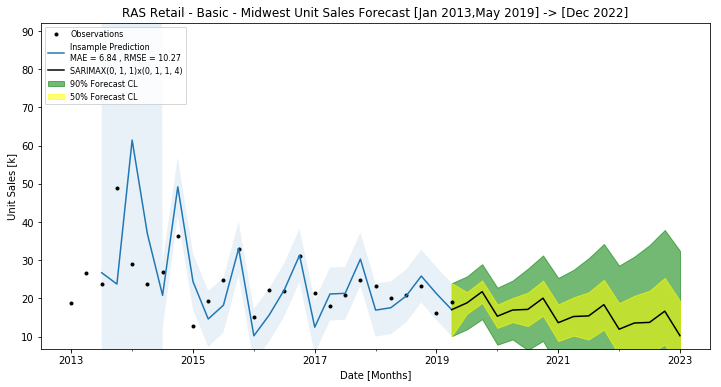

(12, 6)


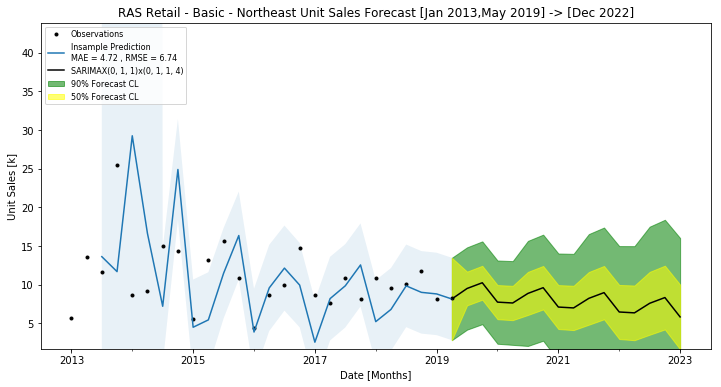

(12, 6)


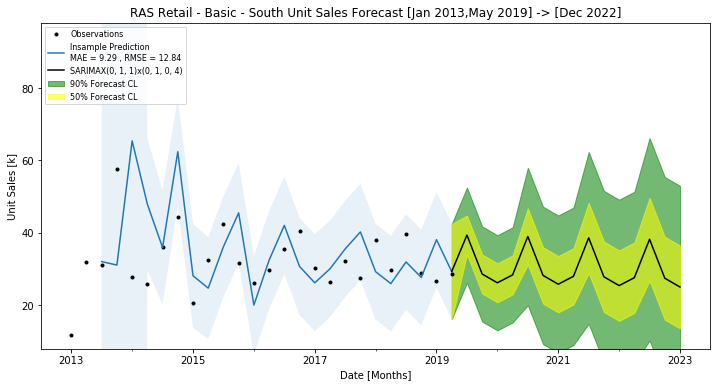

(12, 6)


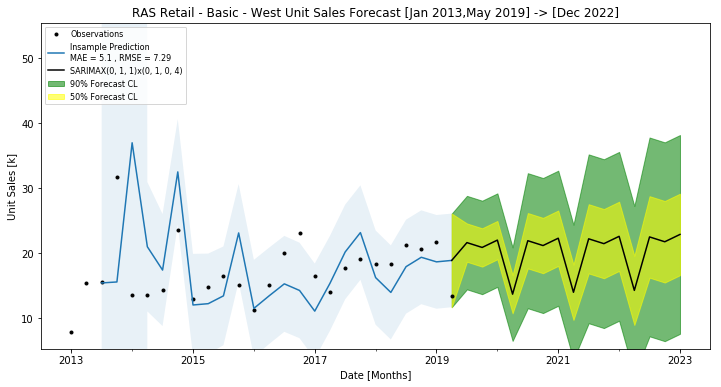

(12, 6)


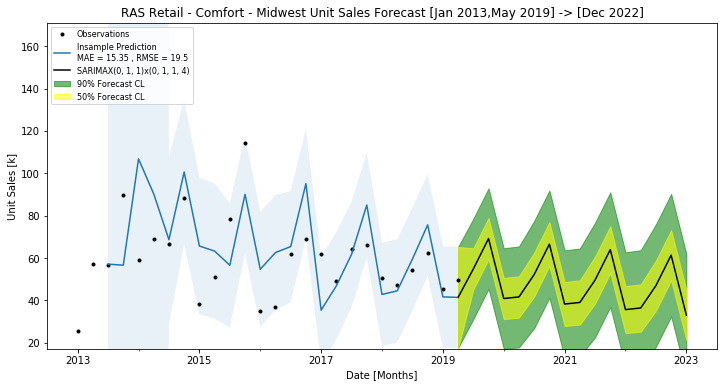

(12, 6)


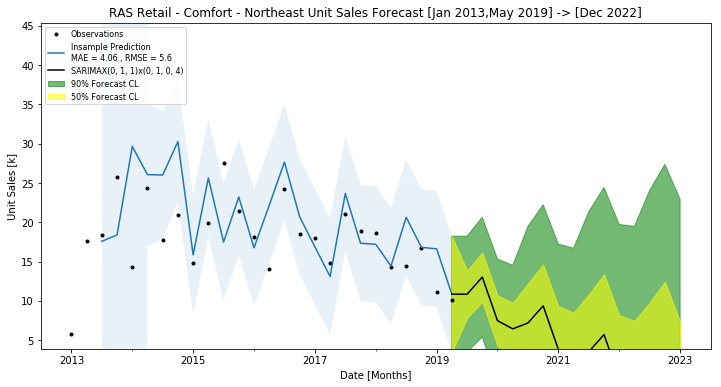

(12, 6)


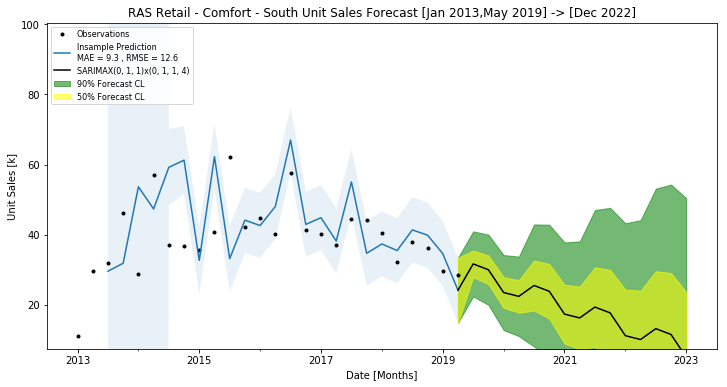

(12, 6)


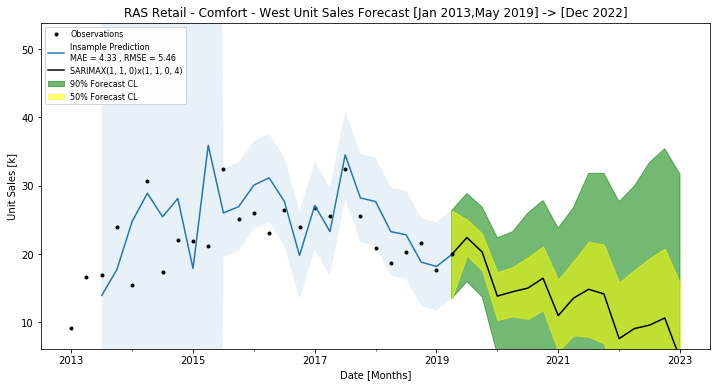

(12, 6)


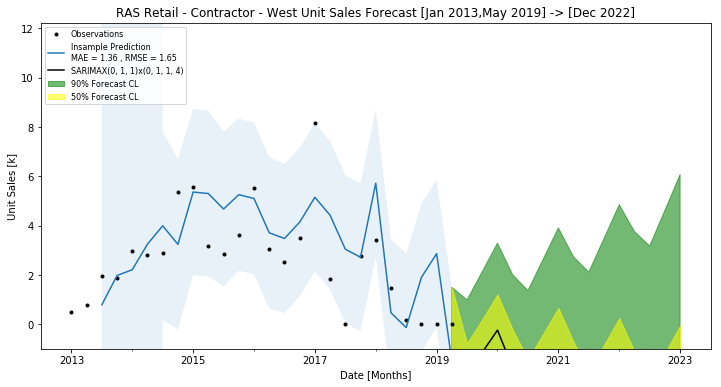

(12, 6)


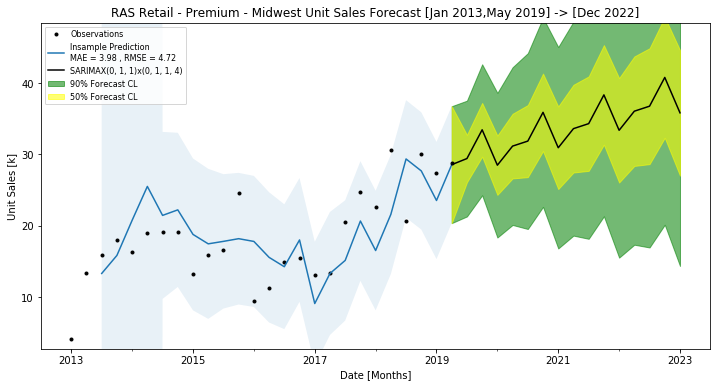

(12, 6)


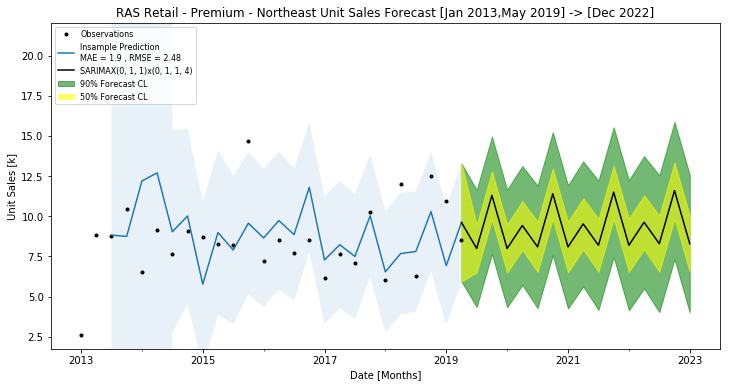

(12, 6)


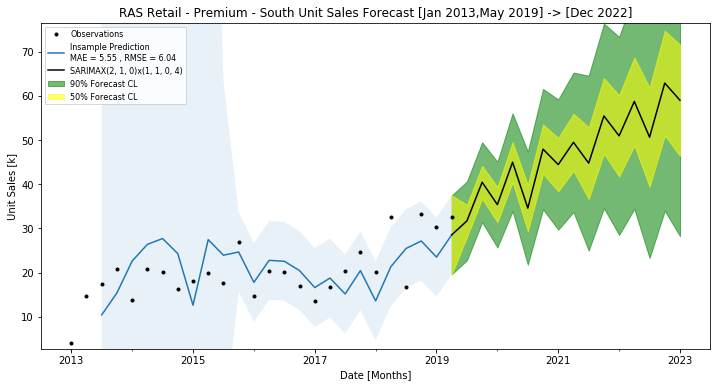

(12, 6)


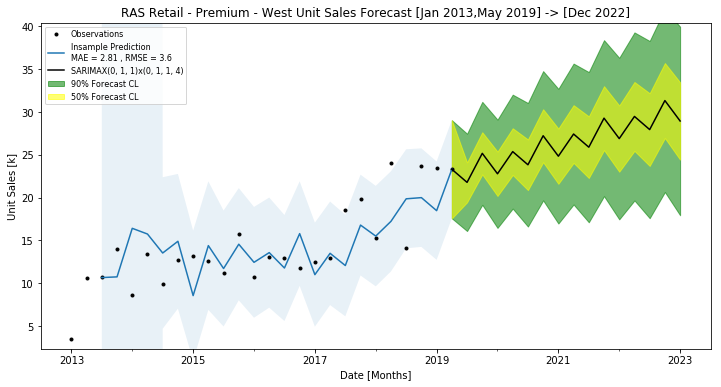

In [85]:
pccatregfullresults = fitSalesData(salesdata)

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2529.107,1276.541,1252.566,49.526,NaN,NaN,None
2014,2868.731,3427.671,-558.940,-19.484,11.839,62.758,35.5
2015,2974.226,3003.628,-29.402,-0.989,3.547,-14.118,4.7
2016,2954.154,3094.941,-140.787,-4.766,-0.679,2.950,4.06
2017,3092.653,3089.314,3.339,0.108,4.478,-0.182,4.58
2018,3279.449,3191.735,87.714,2.675,5.696,3.209,3.2
2019,1549.953,3317.382,NaN,NaN,NaN,3.788,1.16
2020,0.000,3194.400,NaN,NaN,NaN,-3.850,-3.71
2021,0.000,3195.428,NaN,NaN,NaN,0.032,0.0322
2022,0.000,3188.338,NaN,NaN,NaN,-0.222,-0.222


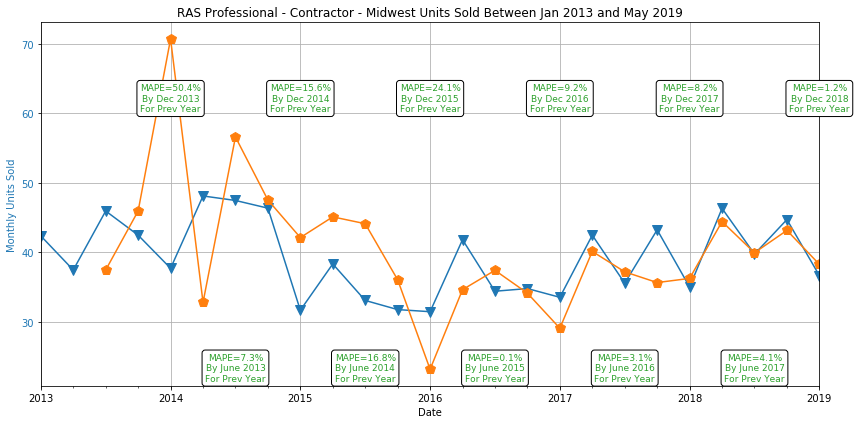

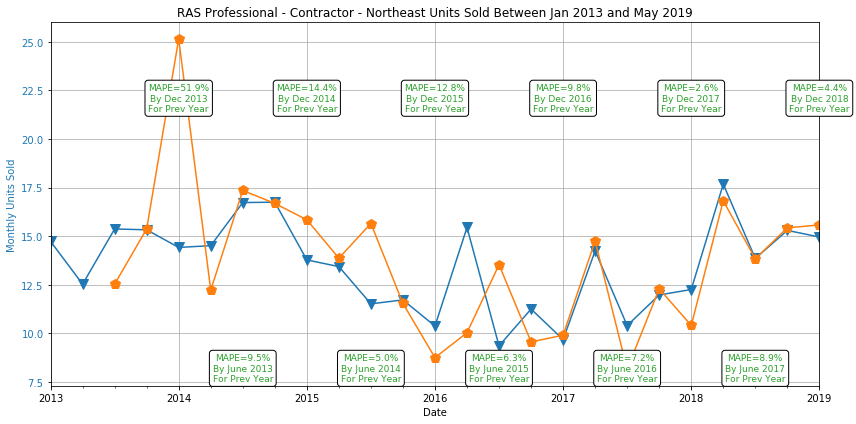

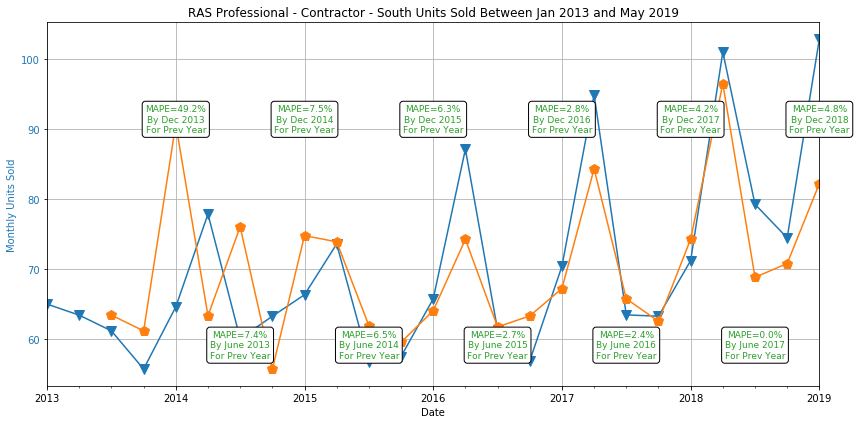

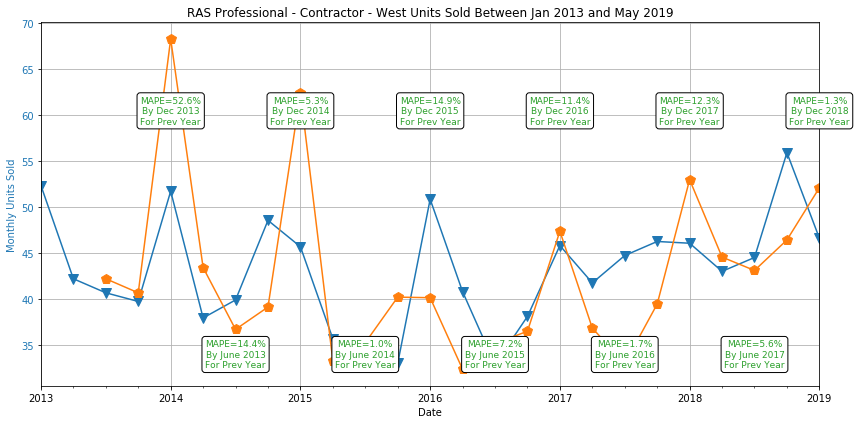

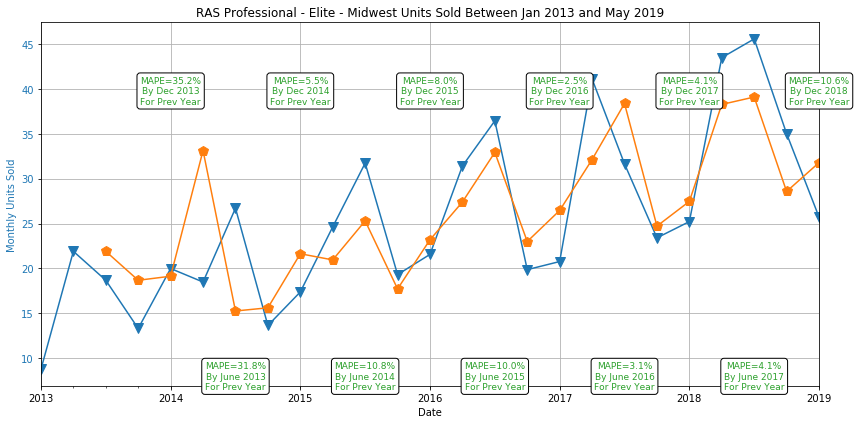

...

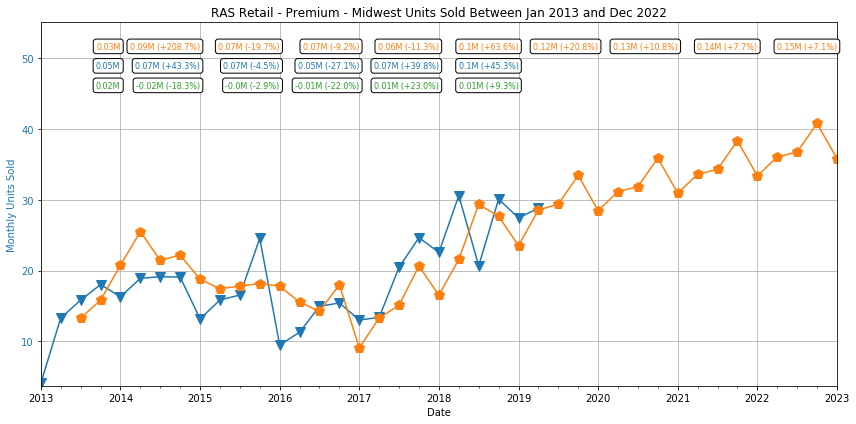

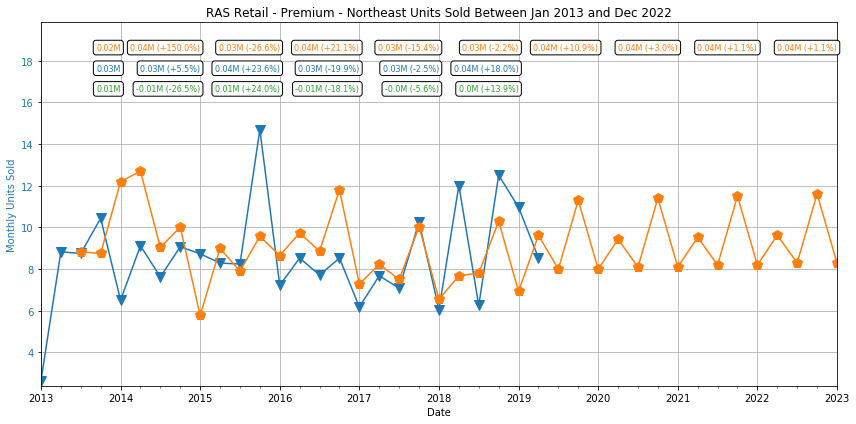

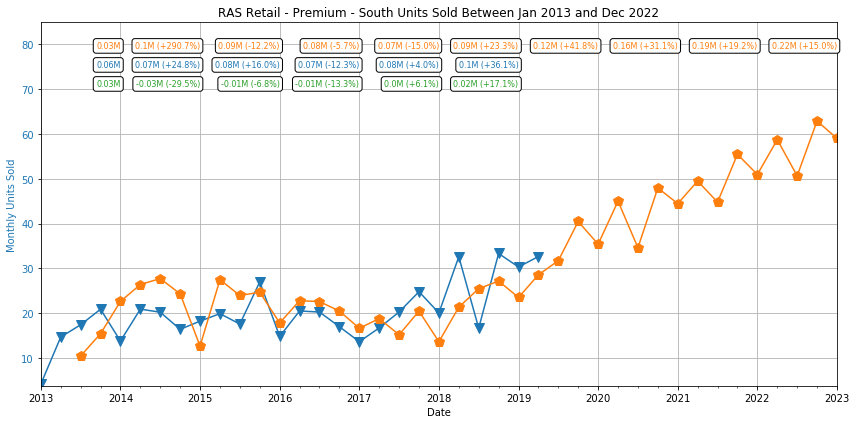

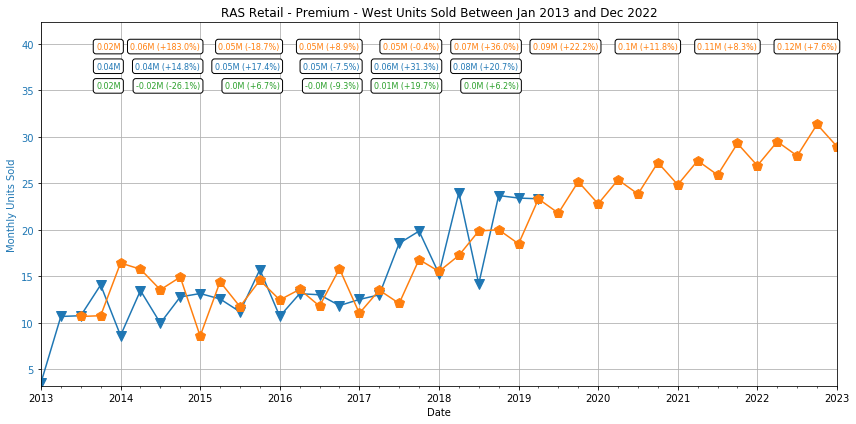

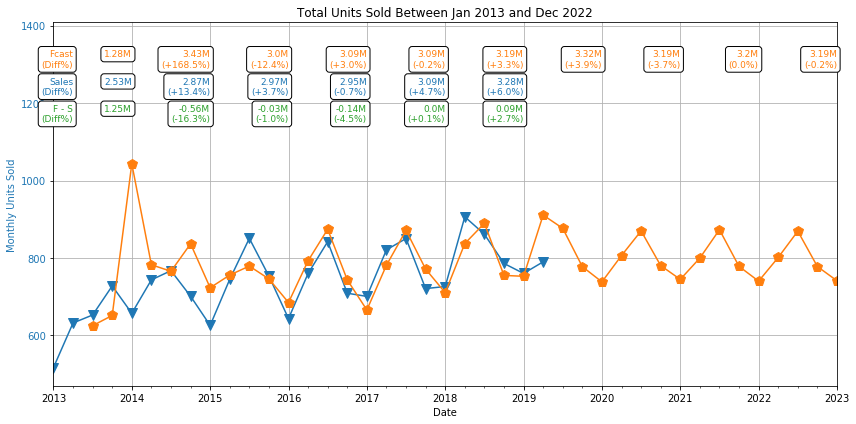

In [86]:
indivMapePlots(pccatregfullresults, startYear)
indivMasterPlots(pccatregfullresults, startYear)
pccatregfullresultsdf = masterPlot(pccatregfullresults, startYear)
pccatregfullresultsdf

# Accuracy Comparison

In [87]:
results = {"Total": totalfullresults, "Category": catfullresults, "Profit Center": pcfullresults, "Region": regfullresults, "PC x Cat": pccatfullresults, "PC x Cat x Reg": pccatregfullresults}

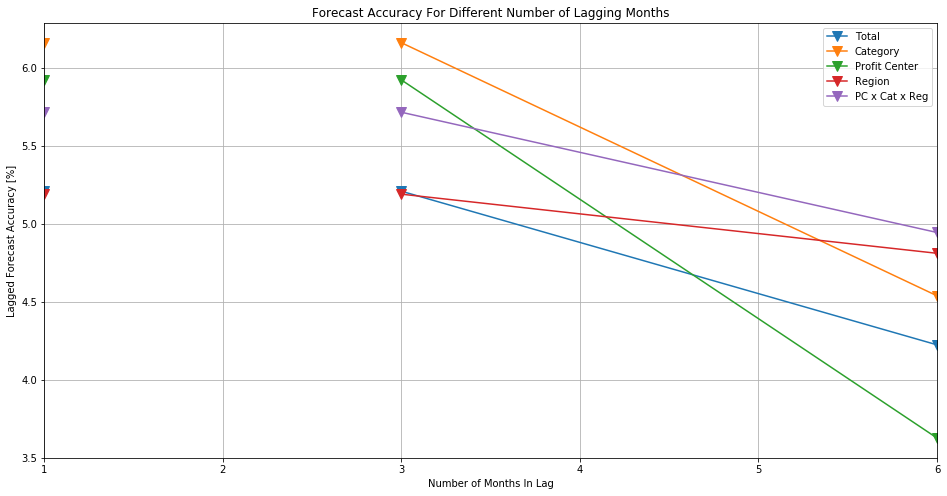

In [88]:
plotResiduals({"Total": combineIndivResults(totalfullresults, 2015),
               "Category": combineIndivResults(catfullresults, 2015),
               "Profit Center": combineIndivResults(pcfullresults, 2015),
               "Region": combineIndivResults(regfullresults, 2015),
               "PC x Cat x Reg": combineIndivResults(pccatregfullresults, 2015)}, size=(16,8))
#plotResiduals(pccatregfullresults, size=(16,8))

# Master Comparison

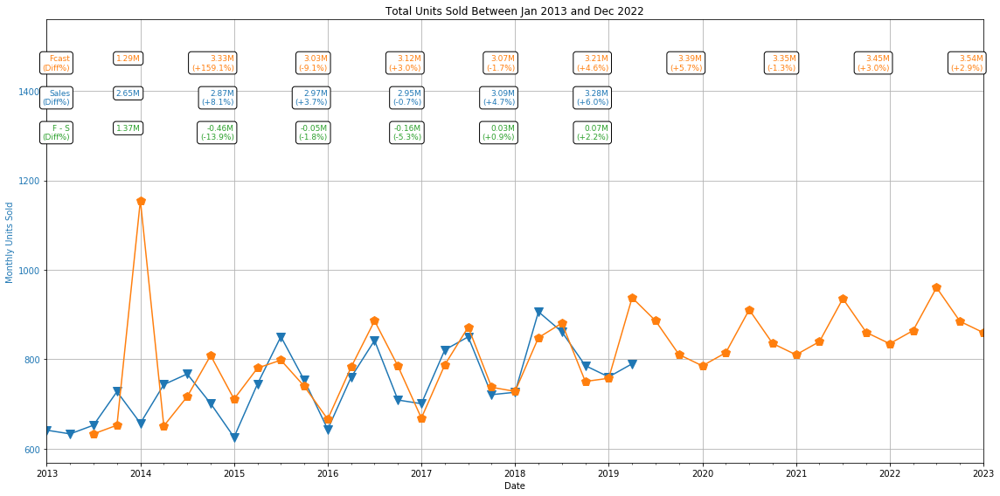

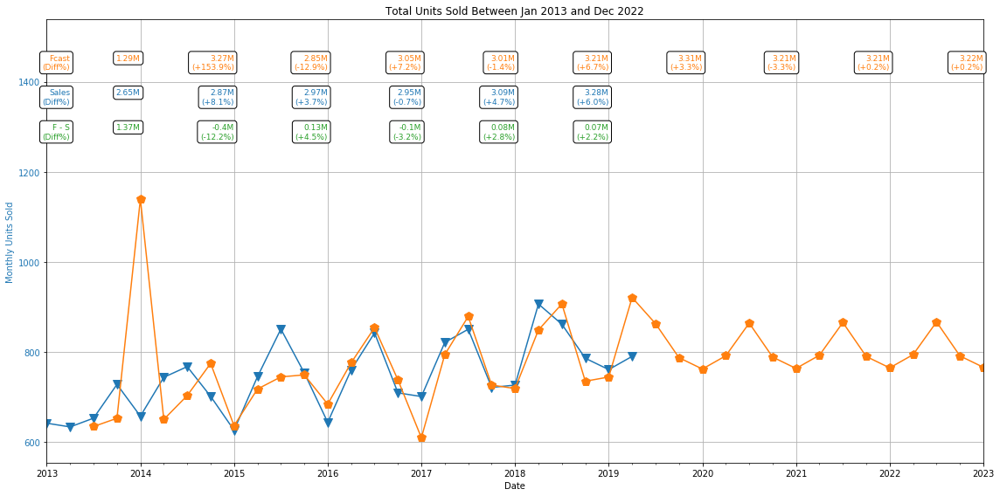

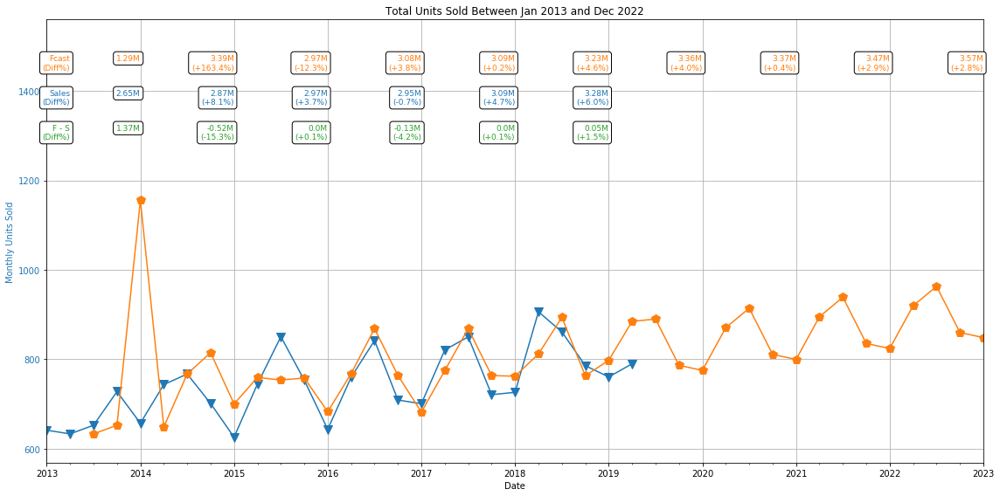

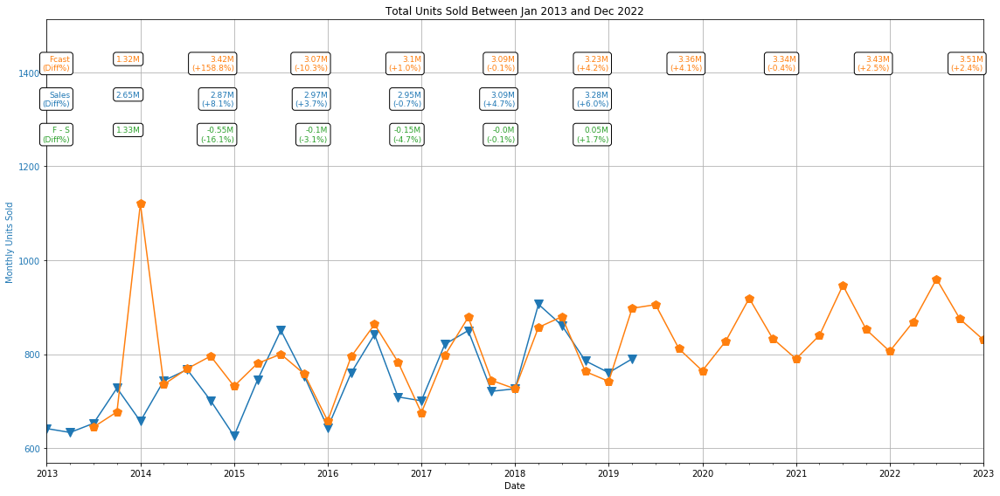

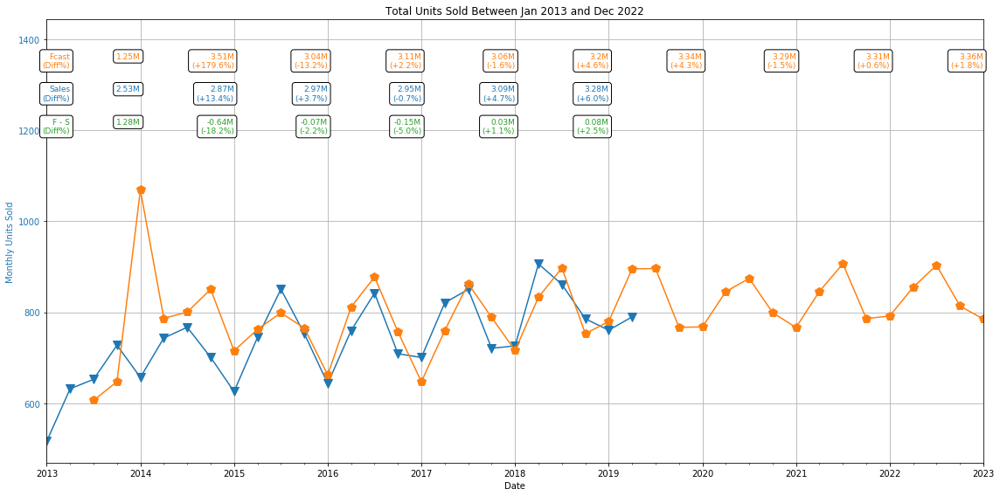

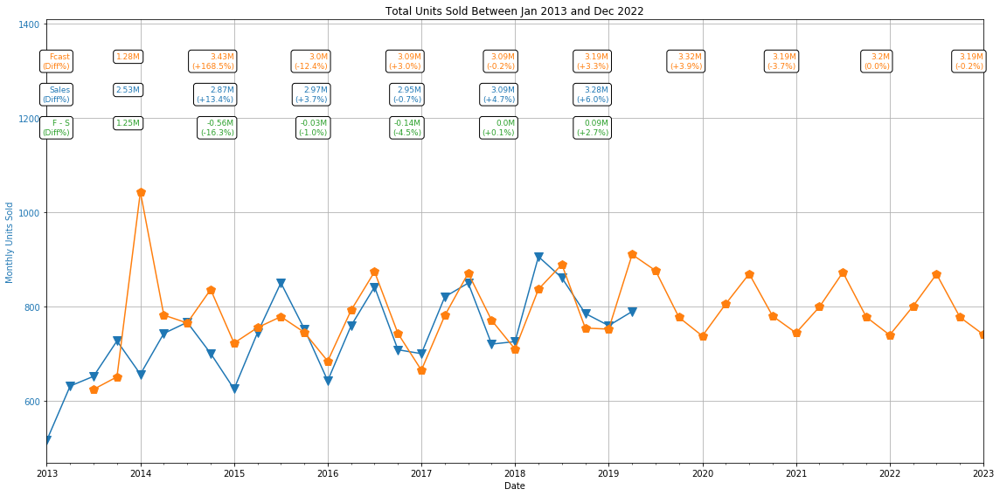

In [89]:
totalfullresultsdf = masterPlot(totalfullresults, startYear, size=(16,8))
pcfullresultsdf = masterPlot(pcfullresults, startYear, size=(16,8))
catfullresultsdf = masterPlot(catfullresults, startYear, size=(16,8))
regfullresultsdf = masterPlot(regfullresults, startYear, size=(16,8))
pccatfullresultsdf = masterPlot(pccatfullresults, startYear, size=(16,8))
pccatregfullresultsdf = masterPlot(pccatregfullresults, startYear, size=(16,8))

In [94]:
startYear = 2013
results = {"Total": totalfullresults, "Category": catfullresults, "Profit Center": pcfullresults, "Region": regfullresults, "PC x Cat": pccatfullresults, "PC x Cat x Reg": pccatregfullresults}
combresults = {}
for k,v in results.items():
    keys = list(v.keys())
    localdata = v[keys[0]]
    for i in range(1,len(keys)):
        localdata = localdata.add(v[keys[i]])
    localresults = localdata[(localdata.index >= to_datetime('{0}-01-01'.format(startYear)))]    
    colname = "Total"

    combresults[k] = localresults

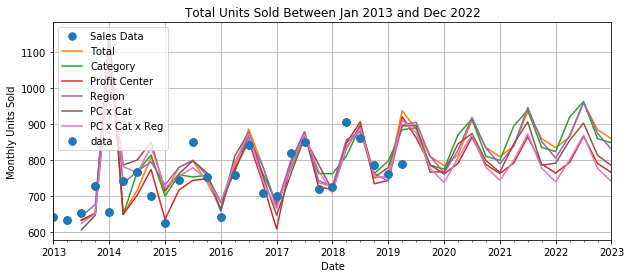

In [113]:
f, ax1 = plt.subplots(1, 1, figsize=(10,4))
truedata = combresults["Total"]['data'] #.resample('2M').sum()
truedata = truedata[(truedata.index < to_datetime('{0}-07-01'.format(2019)))]
ax1 = truedata.plot(ax=ax1, grid=True, style='.', ms=15, label="Sales Data")
ax1.set_ylabel("Monthly Units Sold")
ax1.set_xlabel("Date")
ax1.tick_params(axis='y')
ax1.set_title("{0} Units Sold Between Jan {1} and Dec 2022".format(colname, startYear))
for tsname, tsdata in combresults.items():
    centdata = tsdata["central"] #.resample('1M').sum()
    ax1 = centdata.plot(ax=ax1, grid=True, style='-', ms=2, label=tsname)    
    
ax1 = truedata.plot(ax=ax1, grid=True, style='.', ms=15, color='C0', label=None)
ax1.legend(loc='best')

In [115]:
preddata = {}
upperpreddata = {}
lowerpreddata = {}
freq='1Q'

truedata = combresults["Total"]['data'].resample(freq).sum()
truedata = truedata[(truedata.index < to_datetime('{0}-07-01'.format(2019)))]
for tsname, tsdata in combresults.items():
    centdata = tsdata["central"].resample(freq).sum()
    lowerdata = tsdata["lower value"].resample(freq).sum()
    upperdata = tsdata["upper value"].resample(freq).sum()
    preddata[tsname] = centdata
    upperpreddata[tsname] = upperdata
    lowerpreddata[tsname] = lowerdata

predregion = {}
predregion["Data"]  = truedata
predregion["Central"] = DataFrame(preddata).mean(axis=1)
predregion["Upper"] = DataFrame(preddata).max(axis=1)
predregion["Lower"] = DataFrame(preddata).min(axis=1)
predregion["FC Upper"] = DataFrame(upperpreddata).max(axis=1)
predregion["FC Lower"] = DataFrame(lowerpreddata).min(axis=1)
DataFrame(predregion).head()

,Data,Central,Upper,Lower,FC Upper,FC Lower
2013-03-31,641.474,0.000,0.000,0.000,0.000,0.000
2013-06-30,633.185,0.000,0.000,0.000,0.000,0.000
2013-09-30,652.651,629.456,644.650,606.570,53741.216,-52491.061
2013-12-31,727.670,655.598,677.013,647.482,53100.290,-51797.364
2014-03-31,657.069,1113.689,1155.300,1043.221,43589.702,-41503.260


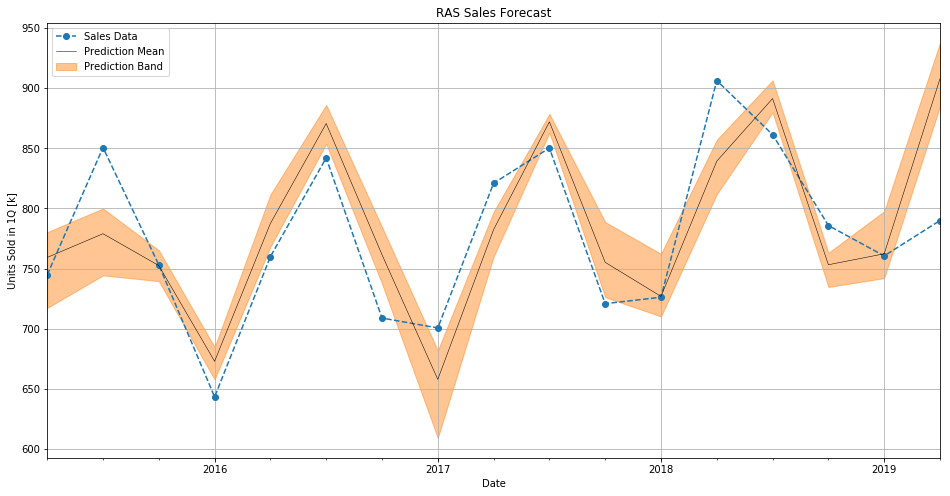

In [117]:
f, ax = plt.subplots(1, 1, figsize=(16,8))
prdf = DataFrame(predregion)
prdf = prdf[(prdf.index <= to_datetime('{0}-07-01'.format(2019))) & (prdf.index >= to_datetime('{0}-05-01'.format(startYear+2)))]    
col = 'C1'
ax = prdf["Data"].plot(ax=ax, style='--.', ms=12, label="Sales Data")
ax.set_ylabel("Units Sold in {0} [k]".format(freq))
ax.set_xlabel("Date")
ax.set_title("RAS Sales Forecast")
#ax.tick_params(axis='y', labelcolor=color)
ax.fill_between(prdf.index, prdf["Lower"], prdf["Upper"], alpha=0.45, color=col, label="Prediction Band")
#ax.fill_between(prdf.index, prdf["FC Lower"], prdf["FC Upper"], alpha=0.35, color='C2', label="Prediction Band")
ax = prdf["Central"].plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Prediction Mean")
ax.legend(loc='upper left')

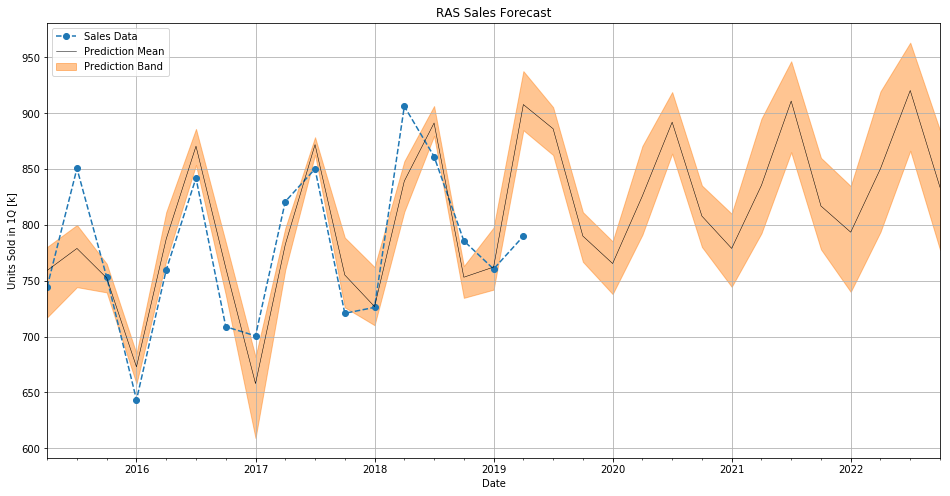

In [118]:
f, ax = plt.subplots(1, 1, figsize=(16,8))
prdf = DataFrame(predregion)
prdf = prdf[(prdf.index < to_datetime('{0}-01-01'.format(2023))) & (prdf.index >= to_datetime('{0}-05-01'.format(startYear+2)))]    
col = 'C1'
ax = prdf["Data"].plot(ax=ax, style='--.', ms=12, label="Sales Data")
ax.set_ylabel("Units Sold in {0} [k]".format(freq))
ax.set_xlabel("Date")
ax.set_title("RAS Sales Forecast")
#ax.tick_params(axis='y', labelcolor=color)
ax.fill_between(prdf.index, prdf["Lower"], prdf["Upper"], alpha=0.45, color=col, label="Prediction Band")
#ax.fill_between(prdf.index, prdf["FC Lower"], prdf["FC Upper"], alpha=0.35, color='C2', label="Prediction Band")
ax = prdf["Central"].plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Prediction Mean")
ax.legend(loc='upper left')

In [119]:
salesgrowth = totalfullresultsdf["Sales (S)"]
salesgrowth[salesgrowth.index >= 2019] = 0
#salesgrowth.index = [x+.5 for x in list(totalfullresultsdf["Growth Sales [%]"].index)]

In [120]:
startYear = 2013
results = {"Total": totalfullresultsdf, "Category": catfullresultsdf, "Profit Center": pcfullresultsdf, "Region": regfullresultsdf, "PC x Cat": pccatfullresultsdf, "PC x Cat x Reg": pccatregfullresultsdf}
results = DataFrame({k: v["Forecast (F)"].copy() for k,v in results.items()})
results = results[results.index >= 2015]

salesgrowth = totalfullresultsdf["Sales (S)"]
salesgrowth = salesgrowth[salesgrowth.index >= 2015]
salesgrowth[salesgrowth.index >= 2019] = None

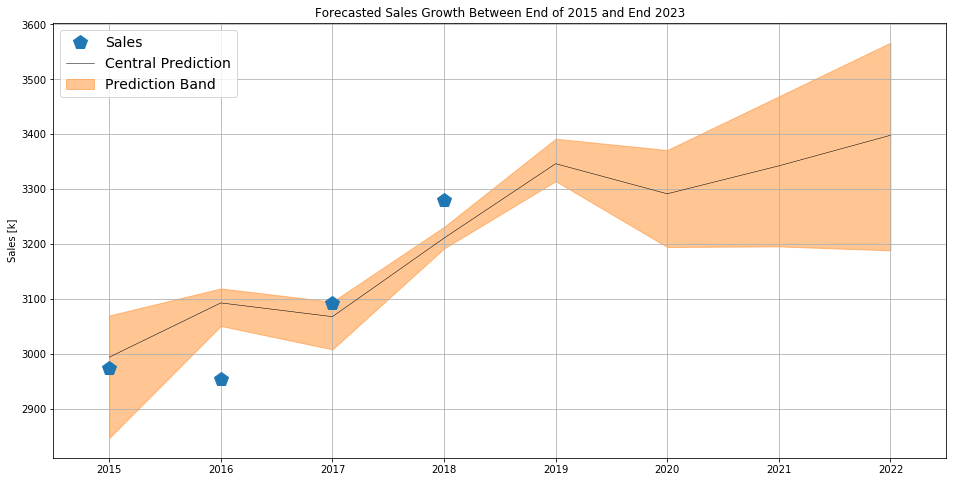

In [121]:
central = results.mean(axis=1)
upper   = results.max(axis=1)
lower   = results.min(axis=1)

f, ax = plt.subplots(1, 1, figsize=(16,8))
salesgrowth.plot(ax=ax, style='p', ms=15, label="Sales")
ax.fill_between(central.index, lower, upper, alpha=0.45, color=col, label="Prediction Band")
central.plot(ax=ax, grid=True, style='-', lw=0.5, color='black', label="Central Prediction")
ax.set_ylabel("Sales [k]")
ax.set_title("Forecasted Sales Growth Between End of 2015 and End 2023")
ax.set_xlim([2014.5, 2022.5])
ax.legend(loc='upper left', fontsize=14)

In [122]:
DataFrame([salesgrowth,central,upper,lower]).T

,Sales (S),Unnamed 0,Unnamed 1,Unnamed 2
2015,2974.226,2993.635,3069.610,2846.269
2016,2954.154,3092.508,3118.842,3050.518
2017,3092.653,3067.482,3094.747,3007.804
2018,3279.449,3210.632,3231.084,3191.735
2019,NaN,3346.205,3391.755,3314.347
2020,NaN,3291.369,3371.156,3194.400
2021,NaN,3342.278,3468.943,3195.428
2022,NaN,3397.975,3566.731,3188.338


In [132]:
totalfullresultsdf

,Sales (S),Forecast (F),S - F,S - F (%),Growth Sales [%],Growth Forecast [%],Predicted Growth [%]
2013,2654.980,1285.793,1369.187,51.571,NaN,NaN,None
2014,2868.731,3330.894,-462.163,-16.110,7.451,61.398,25.5
2015,2974.226,3028.990,-54.764,-1.841,3.547,-9.967,5.59
2016,2954.154,3118.842,-164.688,-5.575,-0.679,2.881,4.86
2017,3092.653,3065.323,27.330,0.884,4.478,-1.746,3.76
2018,3279.449,3207.648,71.801,2.189,5.696,4.437,3.72
2019,0.000,3391.755,NaN,NaN,NaN,5.428,3.42
2020,0.000,3346.051,NaN,NaN,NaN,-1.366,-1.35
2021,0.000,3445.072,NaN,NaN,NaN,2.874,2.96
2022,0.000,3544.093,NaN,NaN,NaN,2.794,2.87


In [495]:
1.315 * 12 / 5

3.1559999999999997

In [503]:
cent = DataFrame(predregion)['Central']
cent[(cent.index >= '2019-01-01') & (cent.index <= '2019-06-01')].sum()

1398.9901711105517

In [504]:
(1.39-1.31)/1.31

0.061068702290076216

In [505]:
(3.33 - 3.15)/3.15

0.0571428571428572

In [522]:
df = DataFrame(predregion)["Data"]
df = df[df.index <= '2019-01-01']
pre  = 0
post = 0
for i in range(1,13):
    s = df[df.index.month == i].mean()
    if i <= 5:
        pre += s
    else:
        post += s

print((post+pre)/pre)

2.450896388047059


In [520]:
12/5

2.4

In [524]:
post

1758.6121666666666

In [525]:
post/pre

1.4508963880470593

In [527]:
(1.45-1.4)/1.4

0.03571428571428575

In [528]:
1.31*2.45

3.2095000000000002

In [530]:
(3.33-3.21)/3.33

0.03603603603603607